<a href="https://colab.research.google.com/github/chavan-sanvi/21BDS0166/blob/main/21BDS0166.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [51]:
# EDA DIGITAL ASSIGNMENT 1
#Sanvi Chavan
# 21BDS0166

# Import necessary libraries
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer


In [52]:

# Load dataset
url = "https://raw.githubusercontent.com/salemprakash/EDA/main/Data/bank.csv"
df = pd.read_csv(url)

# Display first few rows
print(df.head())


   age         job  marital  education default  balance housing loan  contact  \
0   59      admin.  married  secondary      no     2343     yes   no  unknown   
1   56      admin.  married  secondary      no       45      no   no  unknown   
2   41  technician  married  secondary      no     1270     yes   no  unknown   
3   55    services  married  secondary      no     2476     yes   no  unknown   
4   54      admin.  married   tertiary      no      184      no   no  unknown   

   day month  duration  campaign  pdays  previous poutcome deposit  
0    5   may      1042         1     -1         0  unknown     yes  
1    5   may      1467         1     -1         0  unknown     yes  
2    5   may      1389         1     -1         0  unknown     yes  
3    5   may       579         1     -1         0  unknown     yes  
4    5   may       673         2     -1         0  unknown     yes  


In [53]:
# Explore Dimension
print("\nDataset Dimensions (Rows, Columns):")
print(df.shape)  # (number of rows, number of columns)

# Summary of Dataset
print("\nSummary of Dataset:")
print(df.info())  # Data types and non-null values

print("\nStatistical Summary (Numerical Columns):")
print(df.describe())  # Summary statistics for numerical data

print("\nStatistical Summary (Categorical Columns):")
print(df.describe(include='object'))  # Summary for categorical data




Dataset Dimensions (Rows, Columns):
(11162, 17)

Summary of Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB
None

Statistical Summary (Nu

In [54]:
# Data Handling

# Convert column names to lowercase and replace spaces with underscores
df.columns = df.columns.str.lower().str.replace(' ', '_')

# Check for missing values
print("Missing Values Before Cleaning:\n", df.isnull().sum())

# Separate numerical and categorical columns
num_cols = df.select_dtypes(include=[np.number]).columns
cat_cols = df.select_dtypes(exclude=[np.number]).columns

# Data Cleaning

# Handling Missing Values
num_imputer = SimpleImputer(strategy="mean")  # Fill numerical columns with mean
cat_imputer = SimpleImputer(strategy="most_frequent")  # Fill categorical columns with mode

df[num_cols] = num_imputer.fit_transform(df[num_cols])
df[cat_cols] = cat_imputer.fit_transform(df[cat_cols])

# Verify missing values after cleaning
print("\nMissing Values After Cleaning:\n", df.isnull().sum())

# Remove duplicate rows if any
df.drop_duplicates(inplace=True)

# Remove unnecessary white spaces from categorical columns
df[cat_cols] = df[cat_cols].apply(lambda x: x.str.strip())

# Display dataset info after cleaning
print("\nDataset Information After Cleaning:")
print(df.info())

# Display first 5 rows after cleaning
print("\nCleaned Dataset Preview:")
print(df.head())

Missing Values Before Cleaning:
 age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

Missing Values After Cleaning:
 age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

Dataset Information After Cleaning:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        11162 non-null  float64
 1   job        11162 non-null  object 
 2   marital    11162 non-null  object 
 3   education  11162 non-null  object 
 4   default

In [56]:
# Univariate Analysis with detailed statistical output for numeric columns
numeric_columns = df.select_dtypes(include='number').columns

# Iterate over each numeric column to display detailed statistics
for col in numeric_columns:
    print(f"\n--- Univariate Analysis for: {col} 21BDS0166---")
    print(f"Mean: {df[col].mean()}")
    print(f"Median: {df[col].median()}")

    print(f"Mode: {df[col].mode()[0]}")
    print(f"Standard Deviation: {df[col].std()}")
    print(f"Min: {df[col].min()}")
    print(f"Max: {df[col].max()}")
    print(f"25th Percentile: {df[col].quantile(0.25)}")
    print(f"75th Percentile: {df[col].quantile(0.75)}")


--- Univariate Analysis for: age 21BDS0166---
Mean: 41.231947679627304
Median: 39.0
Mode: 31.0
Standard Deviation: 11.913369192215445
Min: 18.0
Max: 95.0
25th Percentile: 32.0
75th Percentile: 49.0

--- Univariate Analysis for: balance 21BDS0166---
Mean: 1528.5385235620856
Median: 550.0
Mode: 0.0
Standard Deviation: 3225.4133259461923
Min: -6847.0
Max: 81204.0
25th Percentile: 122.0
75th Percentile: 1708.0

--- Univariate Analysis for: day 21BDS0166---
Mean: 15.658036194230425
Median: 15.0
Mode: 20.0
Standard Deviation: 8.420739541006434
Min: 1.0
Max: 31.0
25th Percentile: 8.0
75th Percentile: 22.0

--- Univariate Analysis for: duration 21BDS0166---
Mean: 371.99381831213043
Median: 255.0
Mode: 97.0
Standard Deviation: 347.1283857163069
Min: 2.0
Max: 3881.0
25th Percentile: 138.0
75th Percentile: 496.0

--- Univariate Analysis for: campaign 21BDS0166---
Mean: 2.508421429851281
Median: 2.0
Mode: 1.0
Standard Deviation: 2.722077181661534
Min: 1.0
Max: 63.0
25th Percentile: 1.0
75th Perce

Univariate Analysis for age:


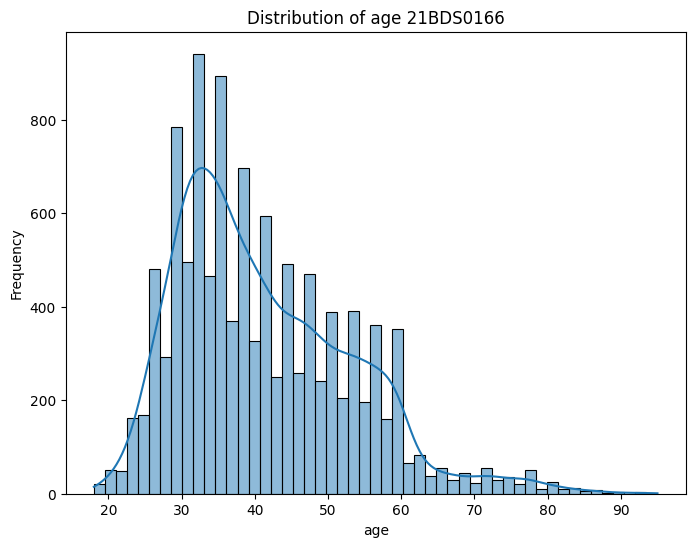

Univariate Analysis for balance:


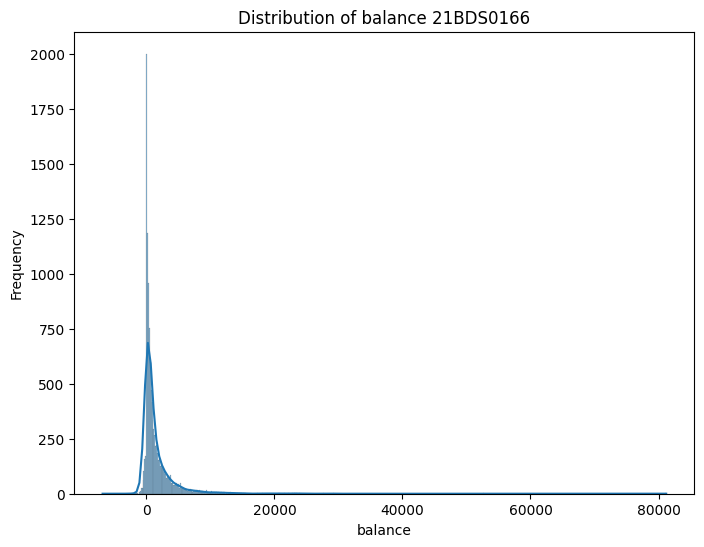

Univariate Analysis for day:


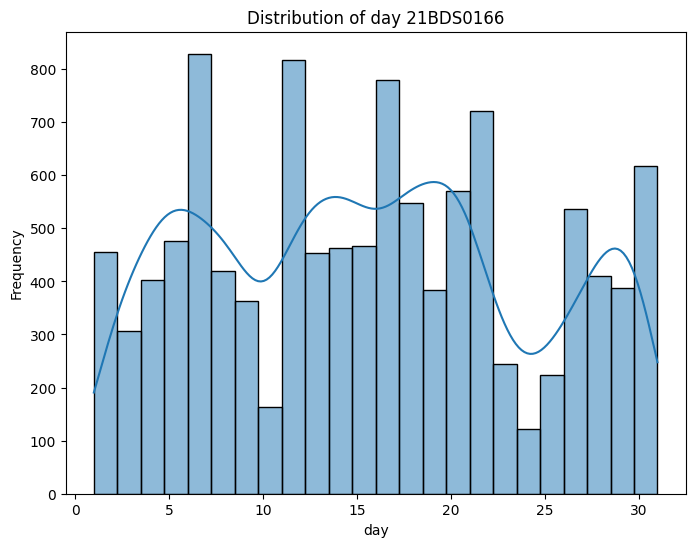

Univariate Analysis for duration:


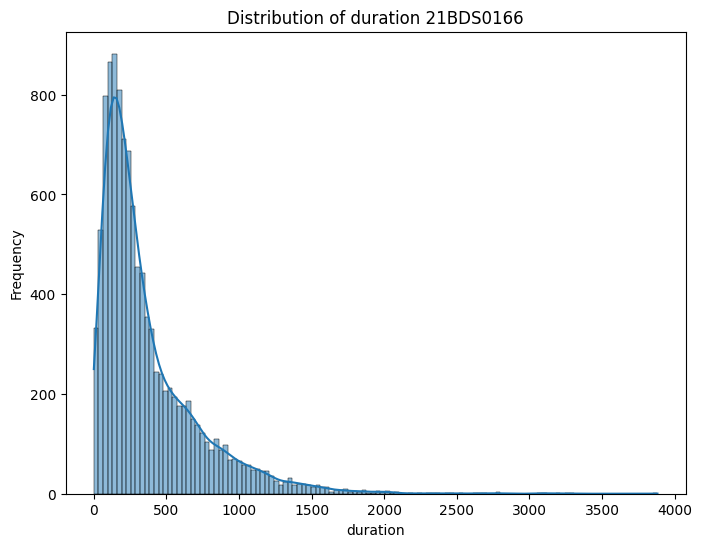

Univariate Analysis for campaign:


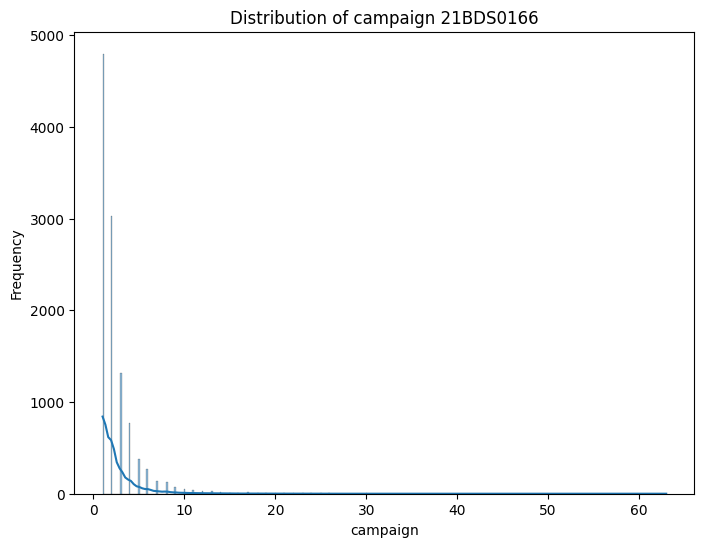

Univariate Analysis for pdays:


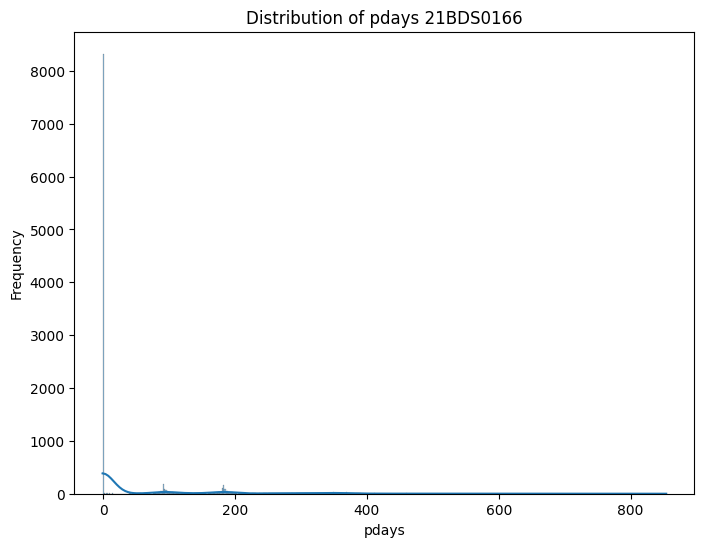

Univariate Analysis for previous:


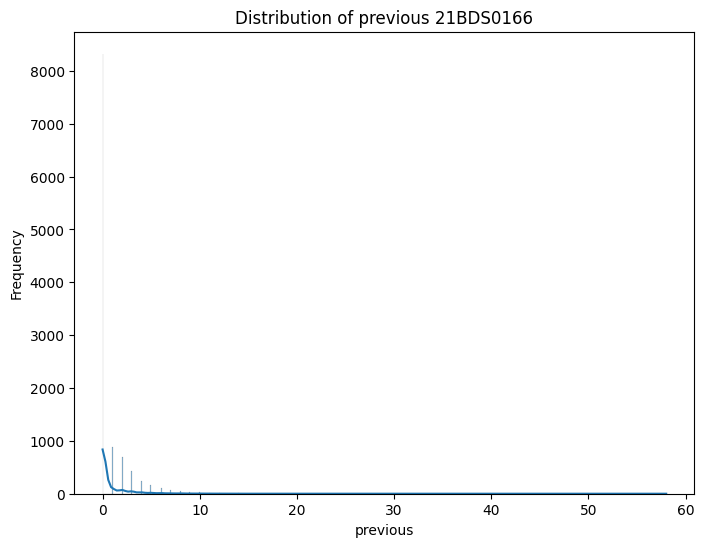

In [58]:
# Univariate Analysis

# Numerical Features
for col in num_cols:
    print(f"Univariate Analysis for {col}:")

    # Histogram
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col} 21BDS0166')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()



Univariate Analysis for age:


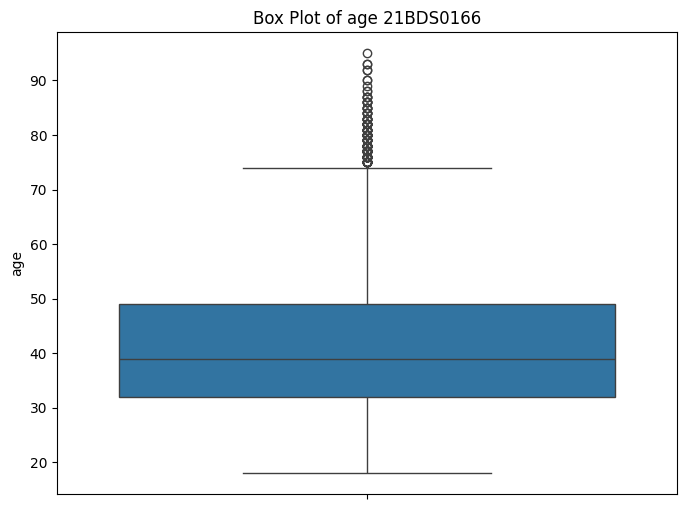

Univariate Analysis for balance:


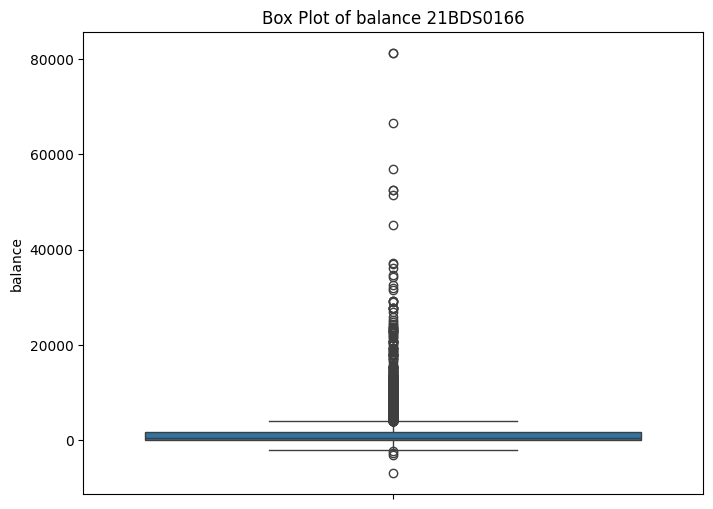

Univariate Analysis for day:


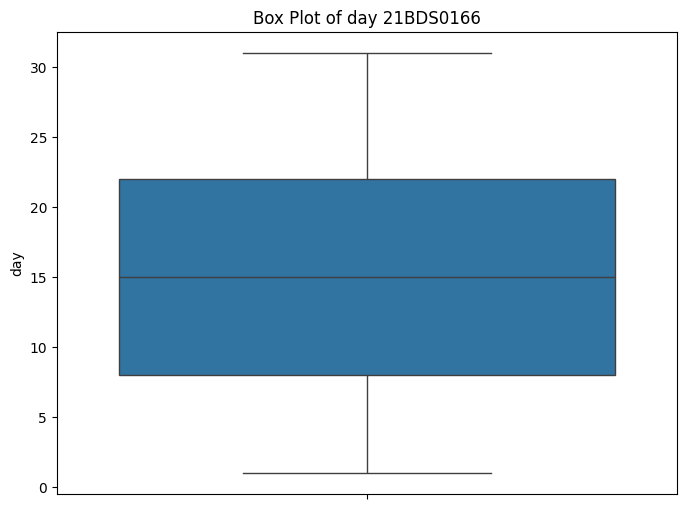

Univariate Analysis for duration:


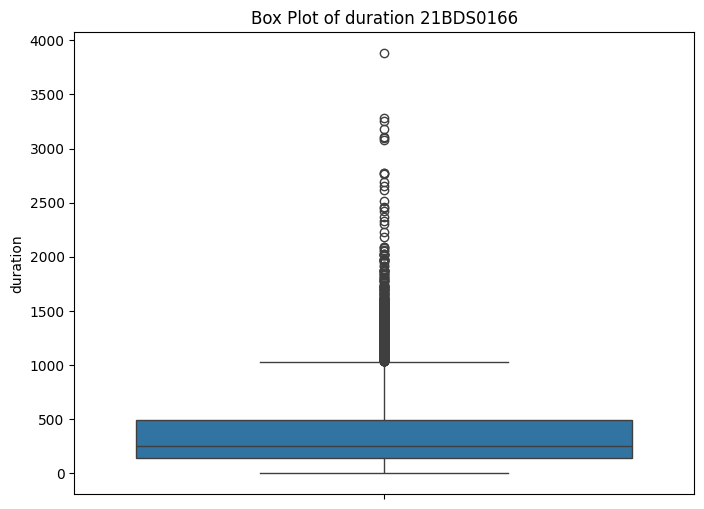

Univariate Analysis for campaign:


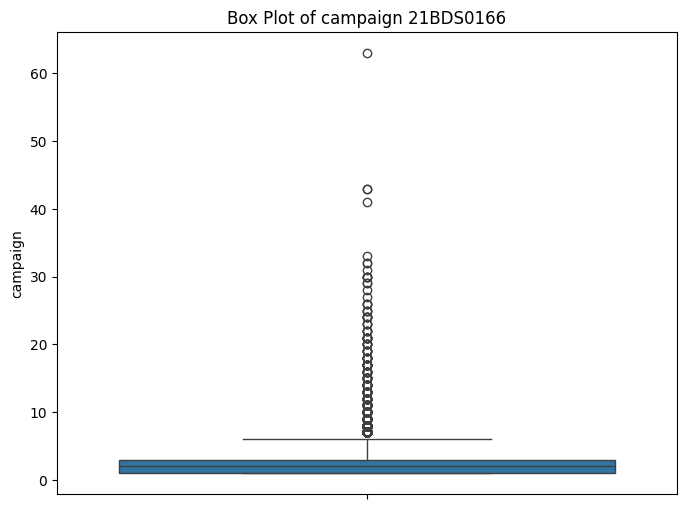

Univariate Analysis for pdays:


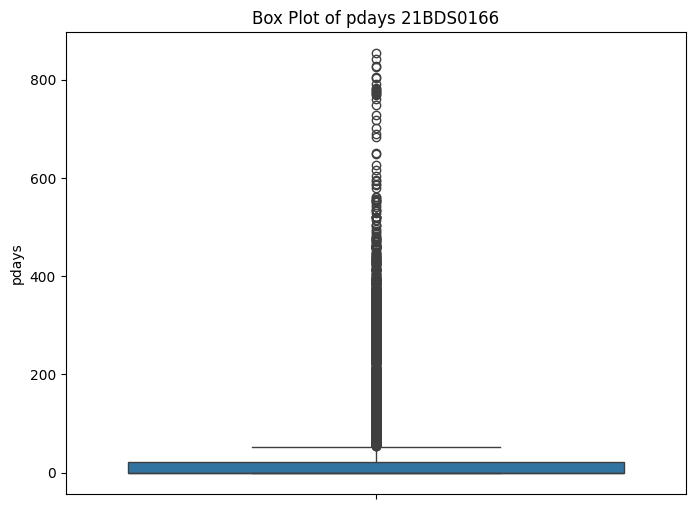

Univariate Analysis for previous:


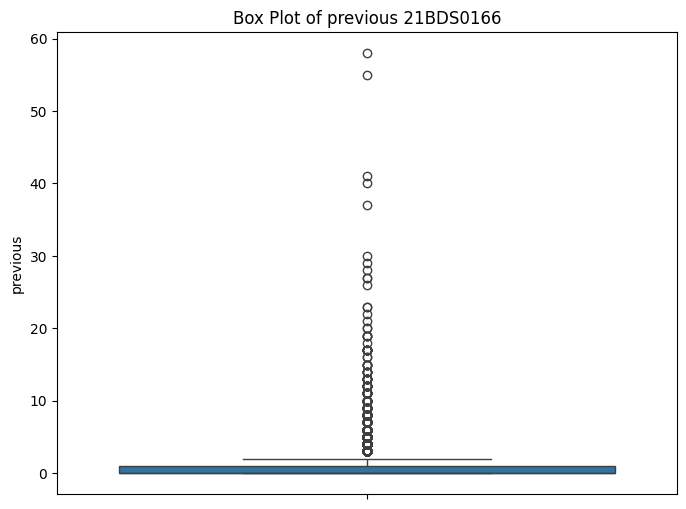

In [60]:
# Univariate Analysis
# Numerical Features
for col in num_cols:
    print(f"Univariate Analysis for {col}:")

    # Box Plot
    plt.figure(figsize=(8, 6))
    sns.boxplot(y=df[col])
    plt.title(f'Box Plot of {col} 21BDS0166')
    plt.ylabel(col)
    plt.show()

Univariate Analysis for job:


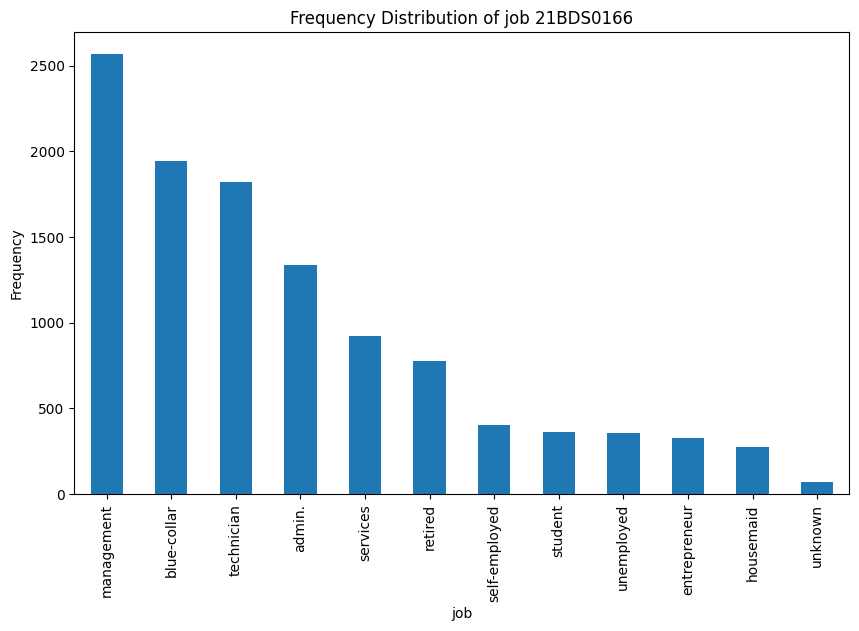

Univariate Analysis for marital:


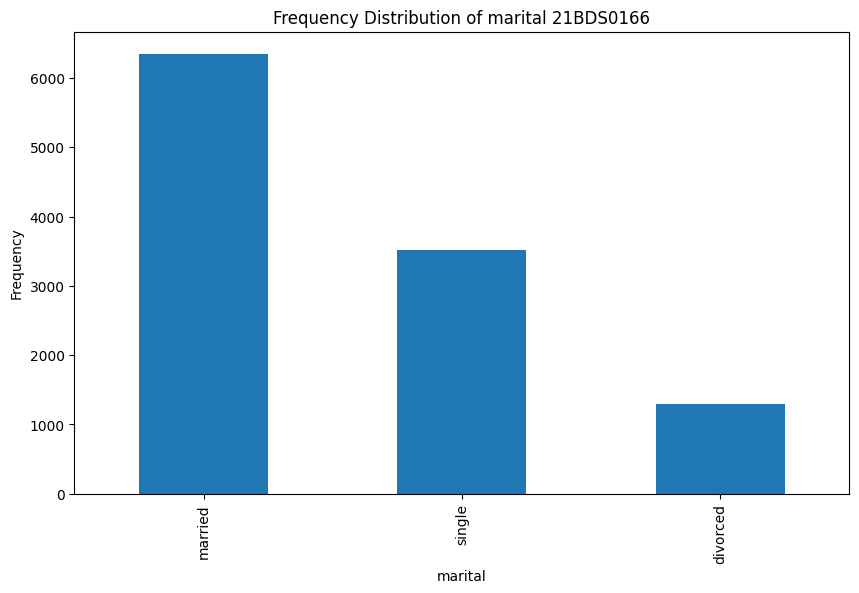

Univariate Analysis for education:


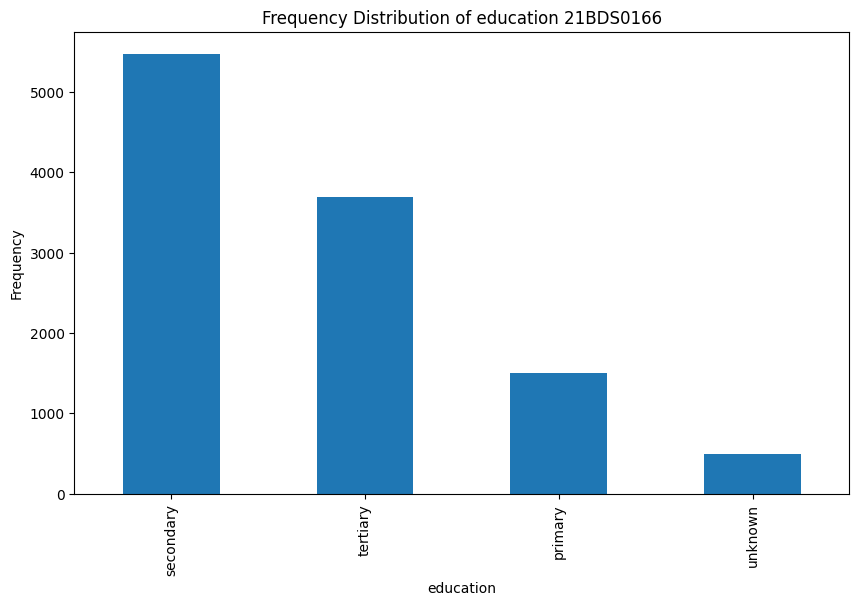

Univariate Analysis for default:


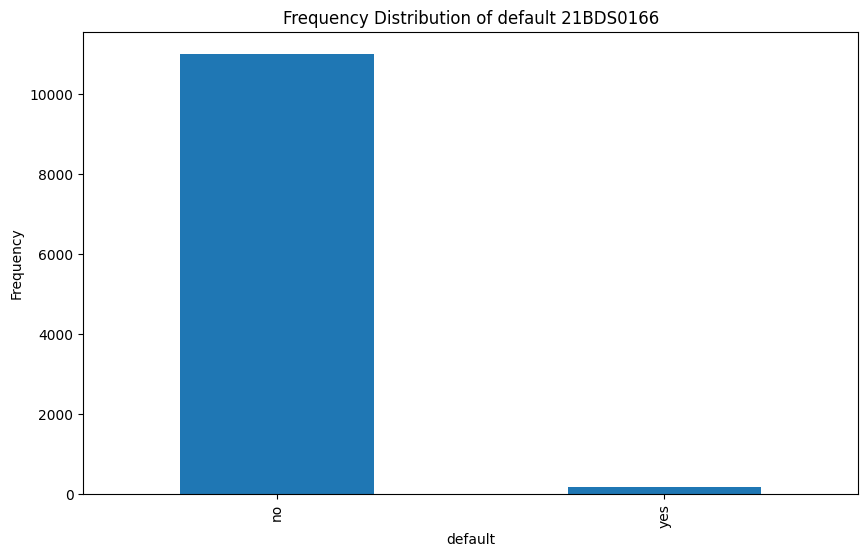

Univariate Analysis for housing:


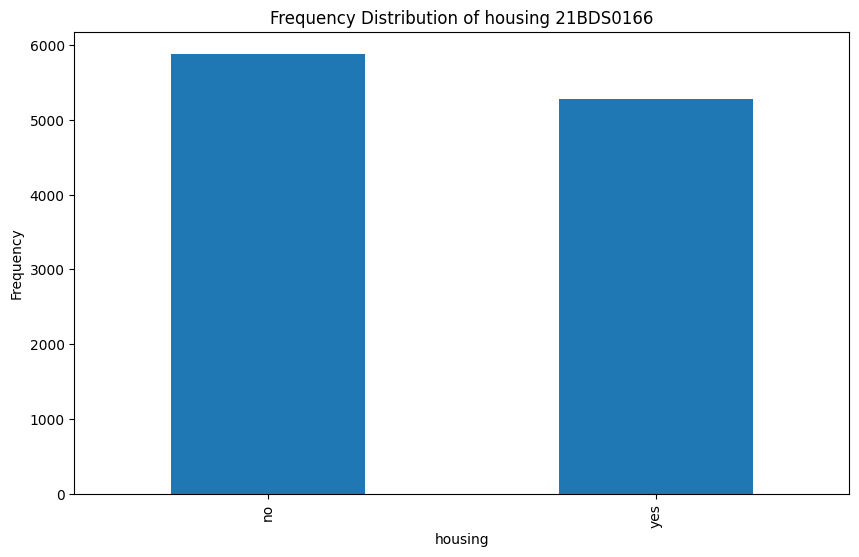

Univariate Analysis for loan:


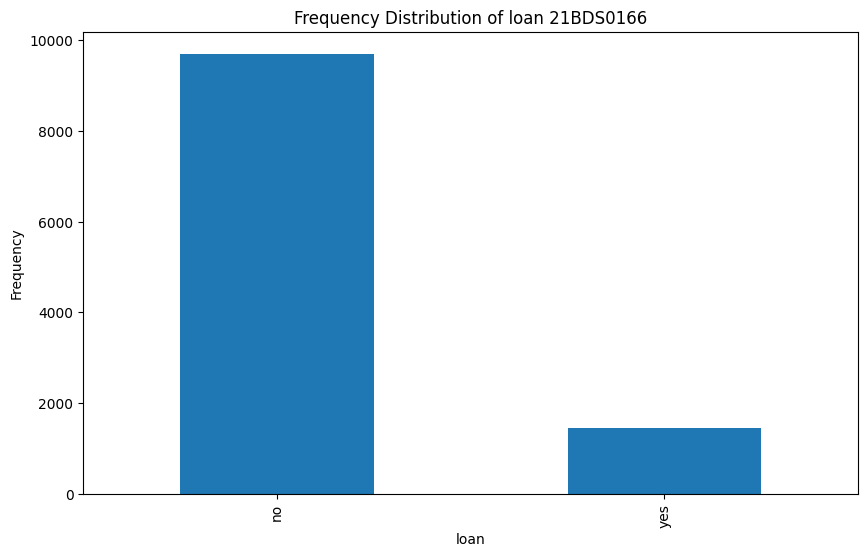

Univariate Analysis for contact:


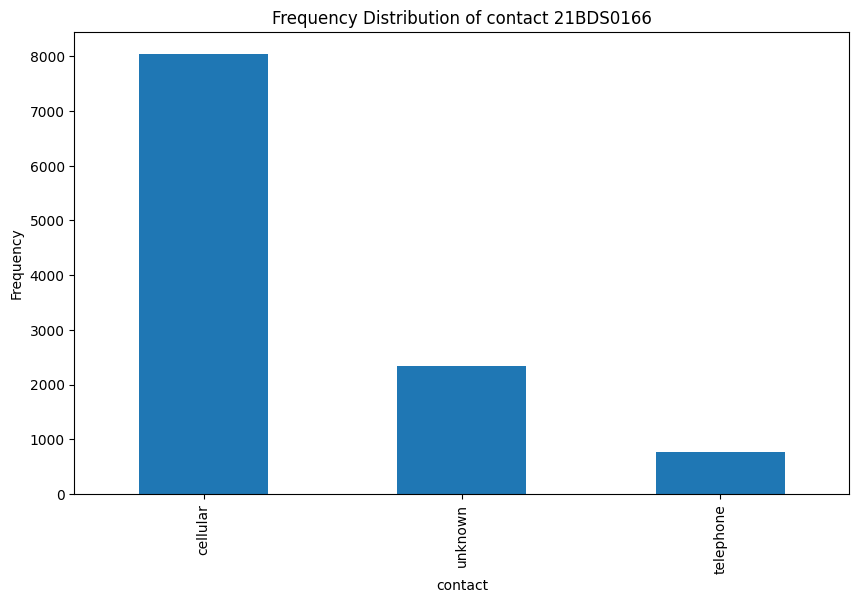

Univariate Analysis for month:


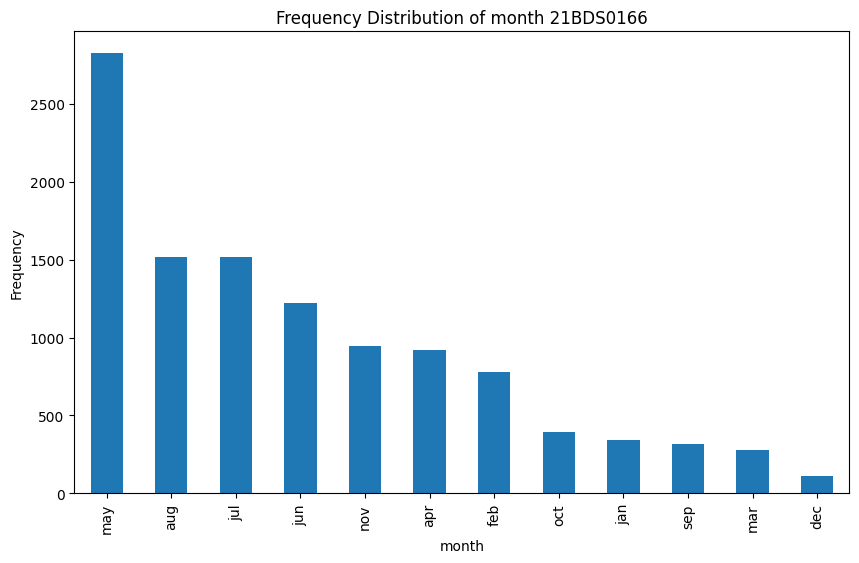

Univariate Analysis for poutcome:


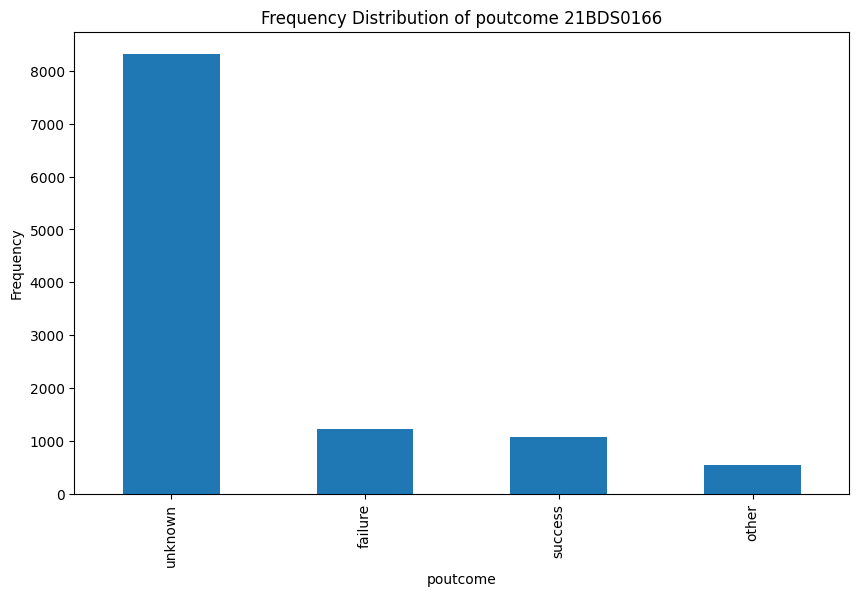

Univariate Analysis for deposit:


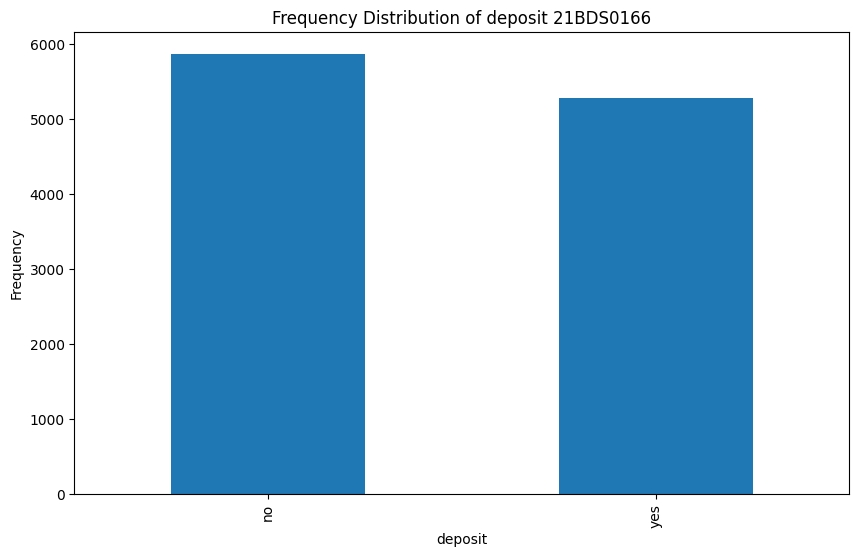

In [61]:
# Univariate Analysis
# Categorical Features
for col in cat_cols:
    print(f"Univariate Analysis for {col}:")

    # Bar Plot
    plt.figure(figsize=(10, 6))
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Frequency Distribution of {col} 21BDS0166')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


Univariate Analysis for job:


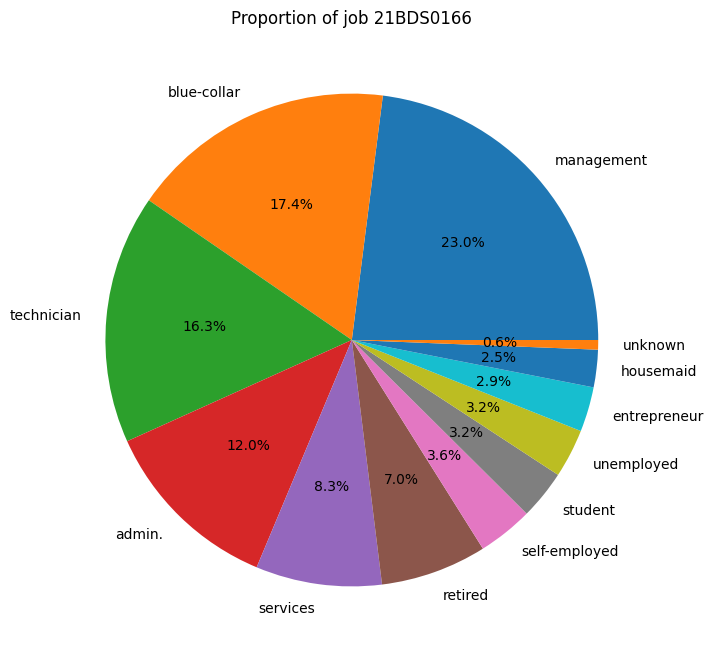

Univariate Analysis for marital:


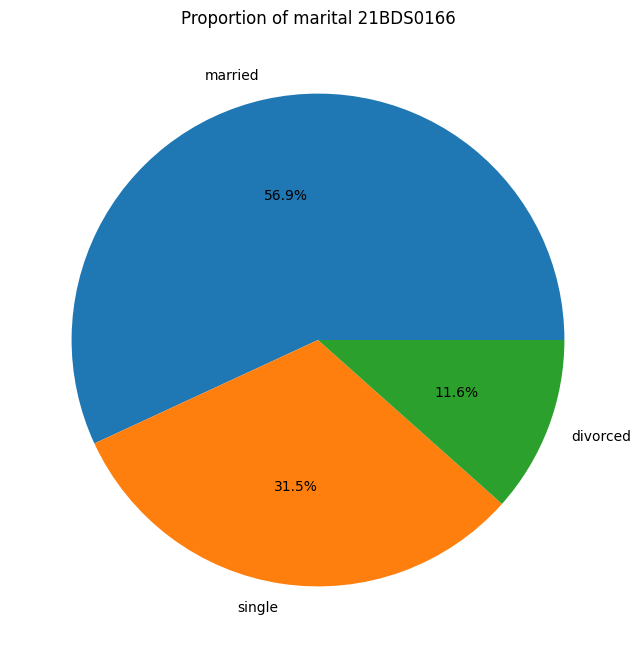

Univariate Analysis for education:


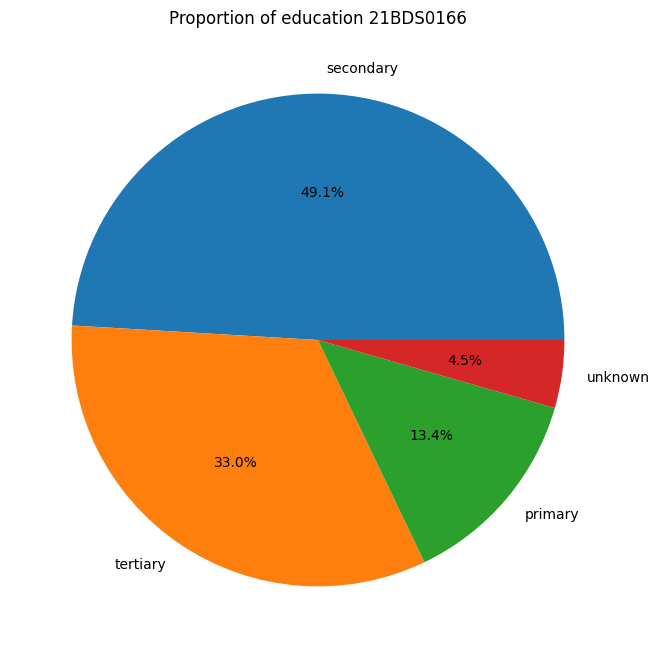

Univariate Analysis for default:


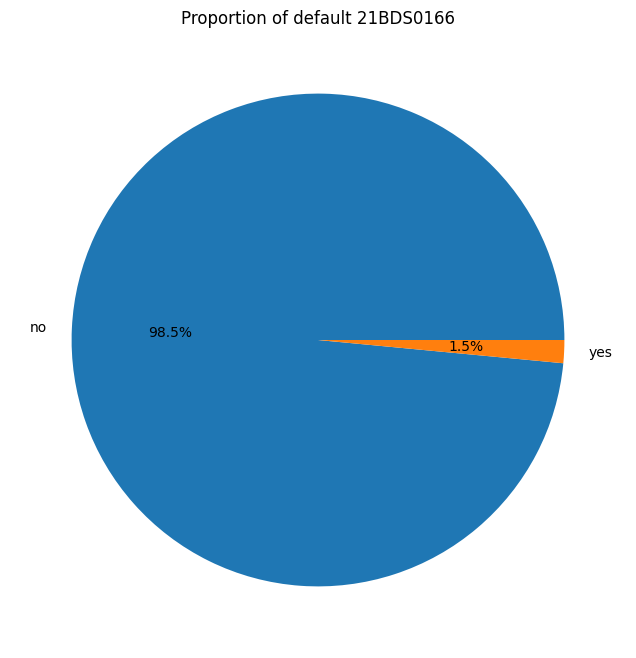

Univariate Analysis for housing:


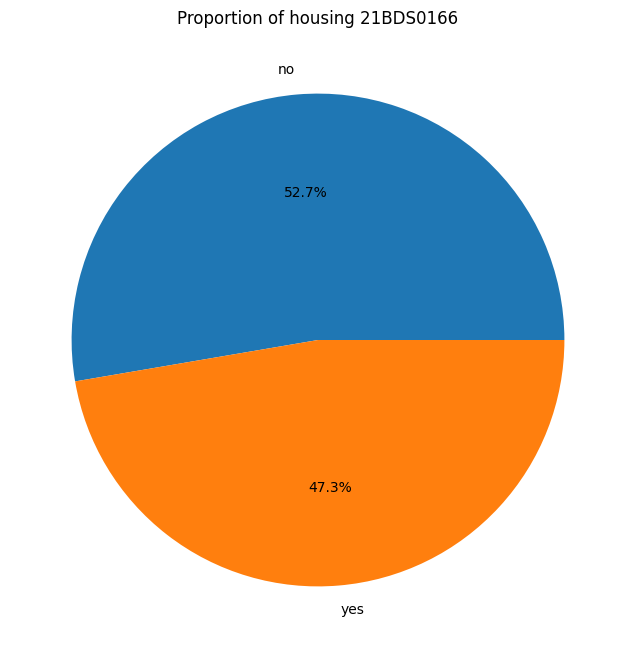

Univariate Analysis for loan:


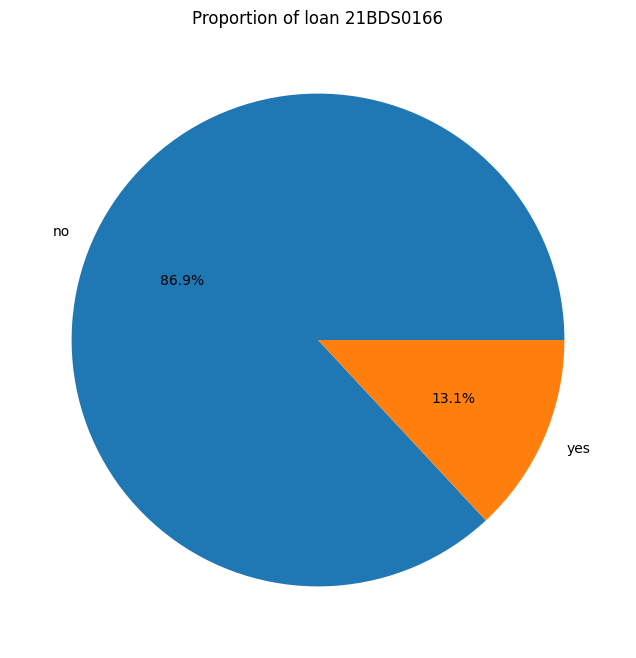

Univariate Analysis for contact:


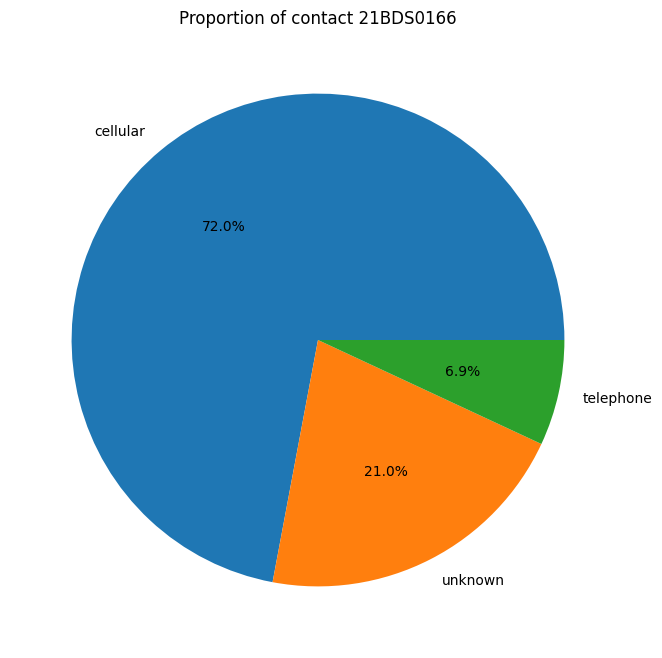

Univariate Analysis for month:


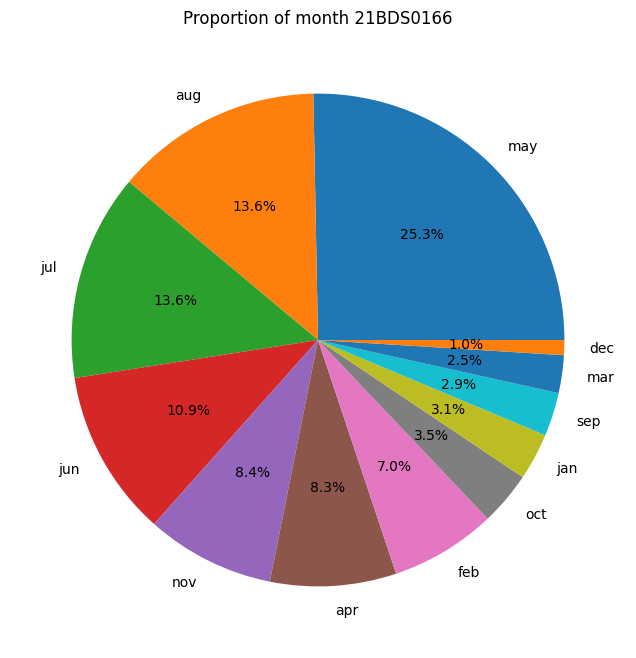

Univariate Analysis for poutcome:


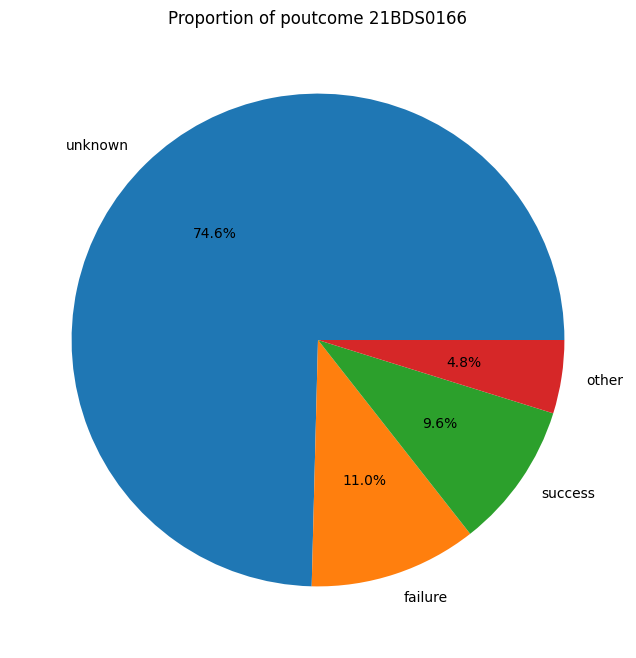

Univariate Analysis for deposit:


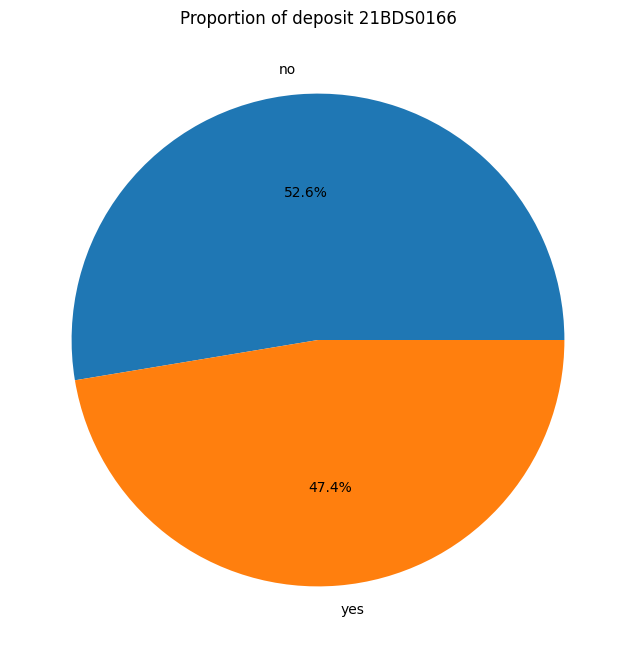

In [62]:
# Univariate Analysis
# Categorical Features
for col in cat_cols:
    print(f"Univariate Analysis for {col}:")

    # Pie Chart
    plt.figure(figsize=(8, 8))
    df[col].value_counts().plot.pie(autopct='%1.1f%%')
    plt.title(f'Proportion of {col} 21BDS0166')
    plt.ylabel('')  # Remove the y-label
    plt.show()

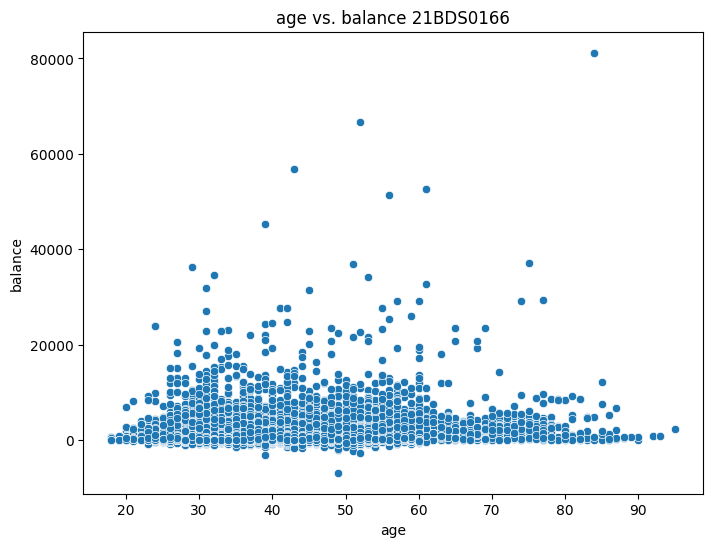

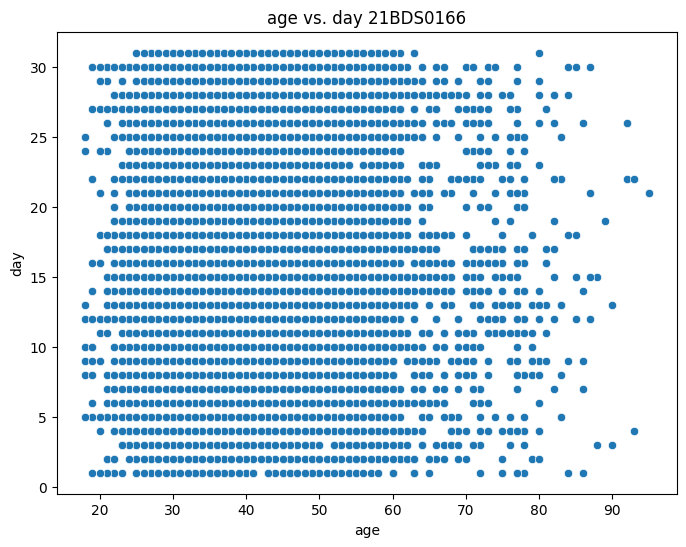

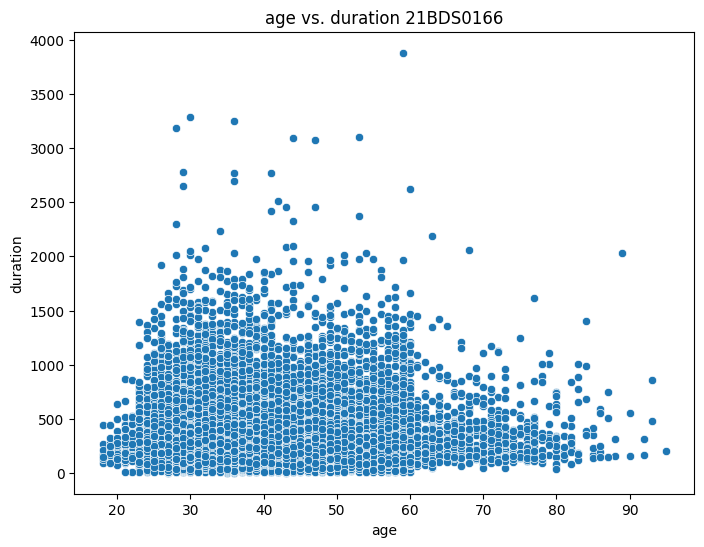

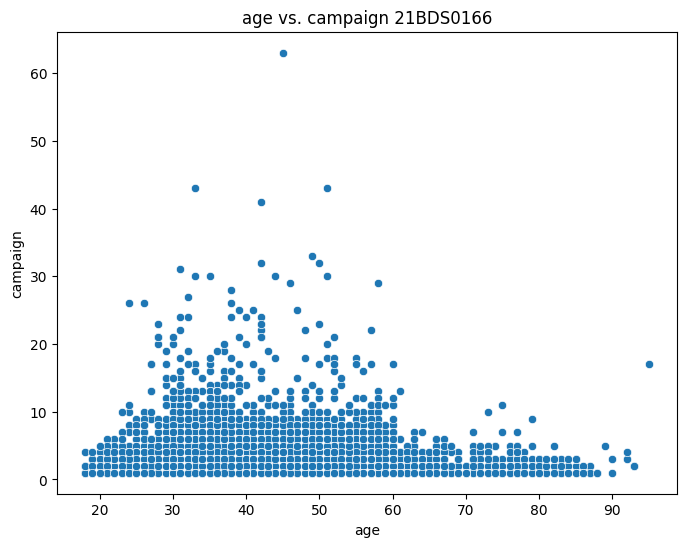

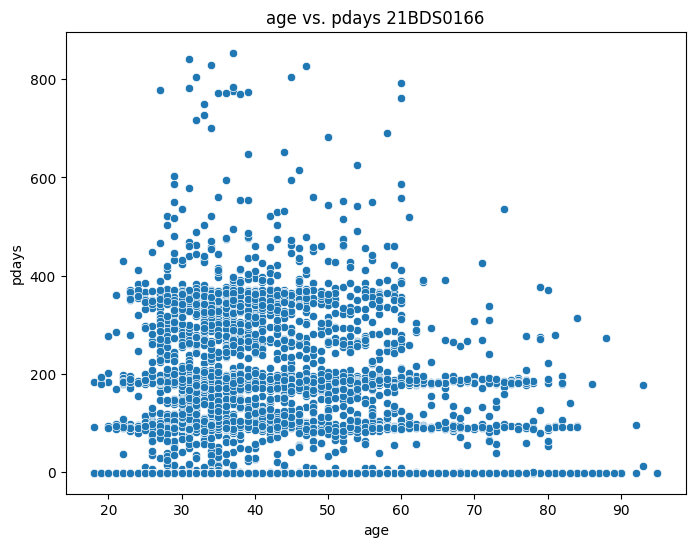

...

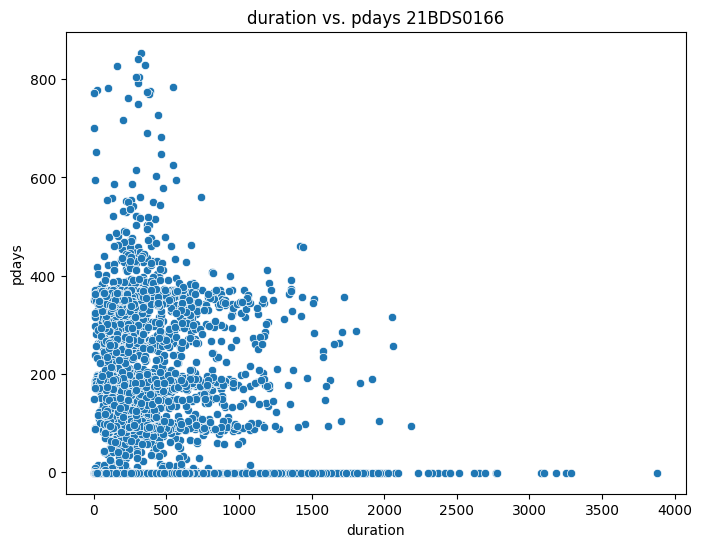

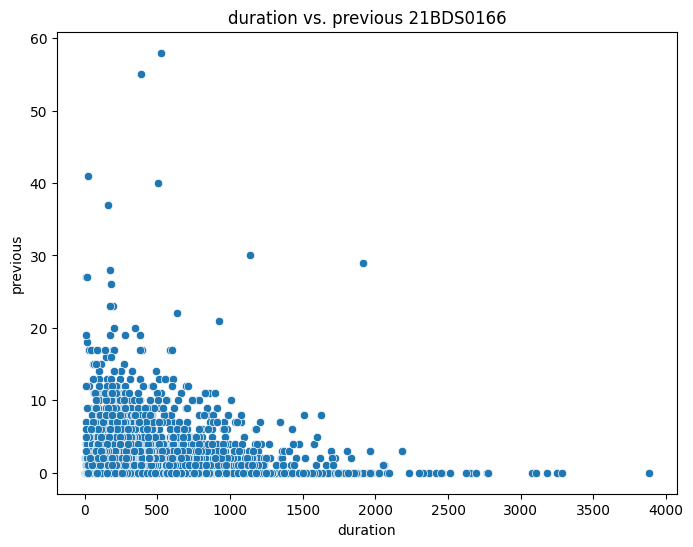

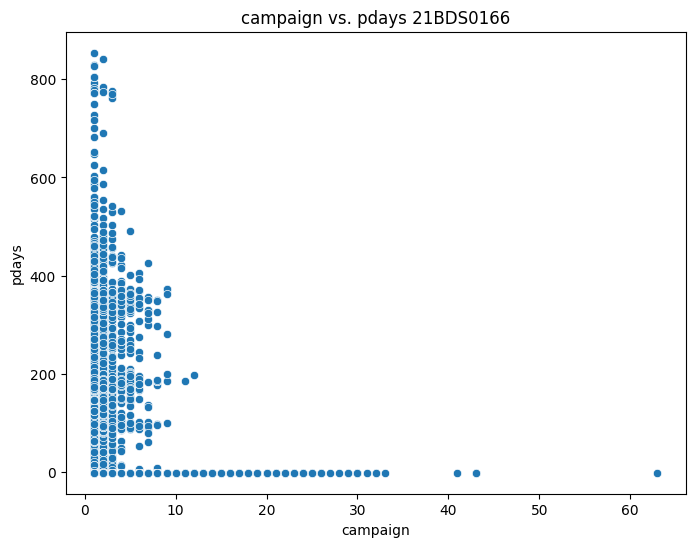

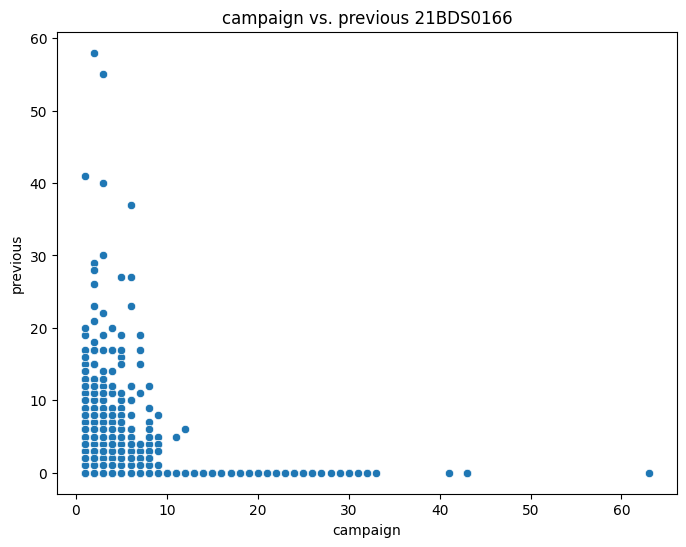

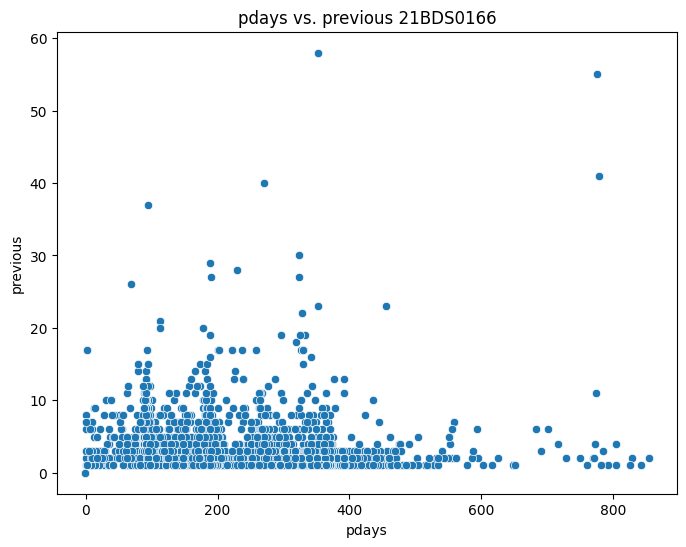

In [64]:
# Bivariate Analysis

# Numerical vs. Numerical
# Scatterplot
for i in range(0, len(num_cols)):
    for j in range(i + 1, len(num_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[num_cols[i]], y=df[num_cols[j]])
        plt.title(f'{num_cols[i]} vs. {num_cols[j]} 21BDS0166')
        plt.show()


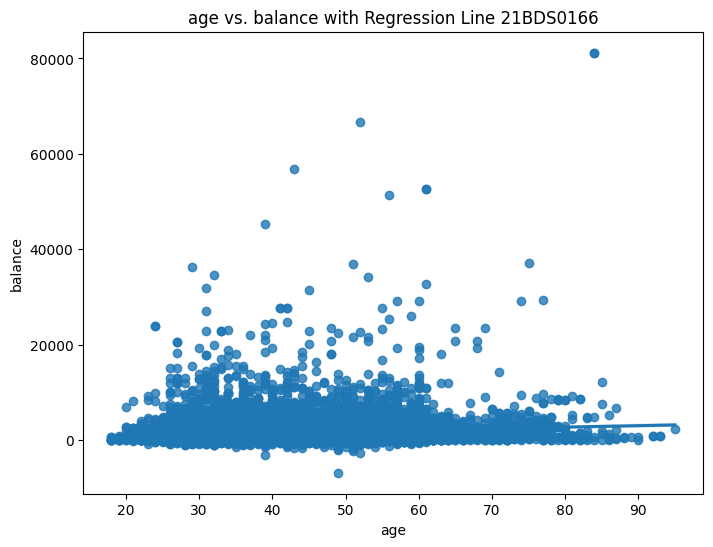

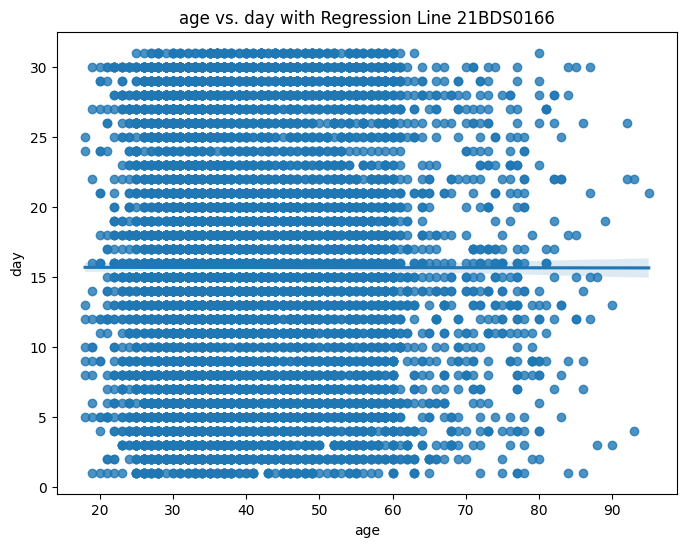

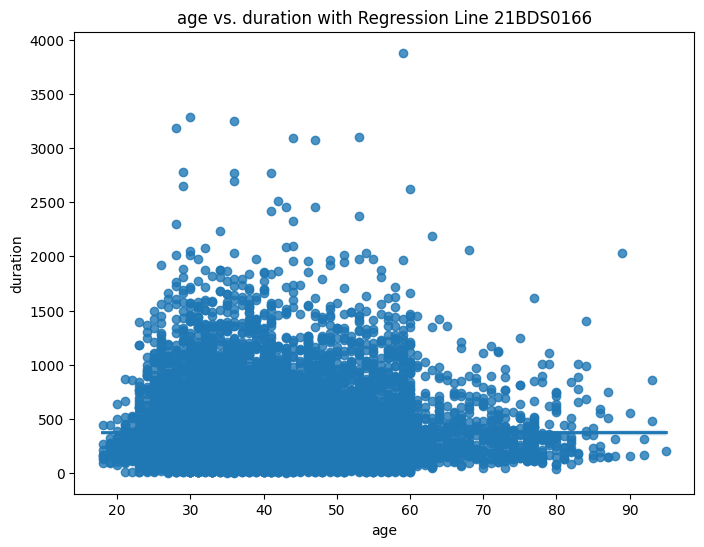

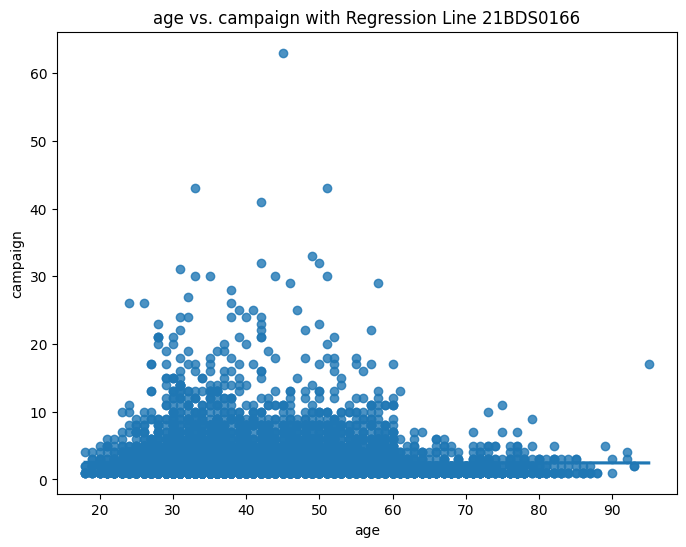

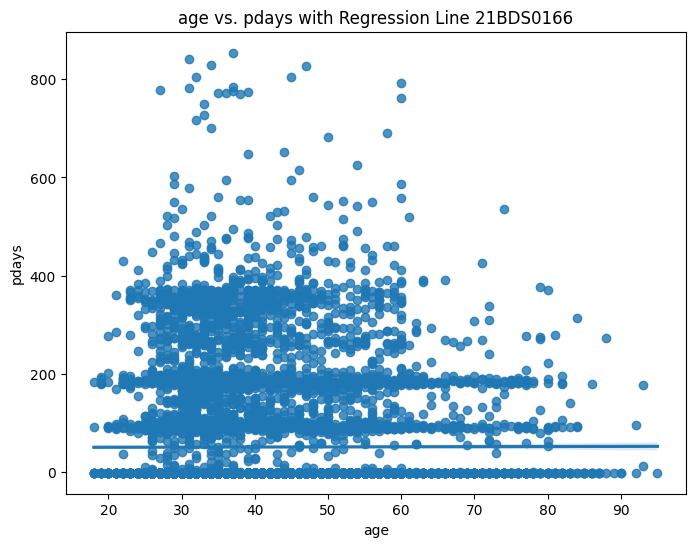

...

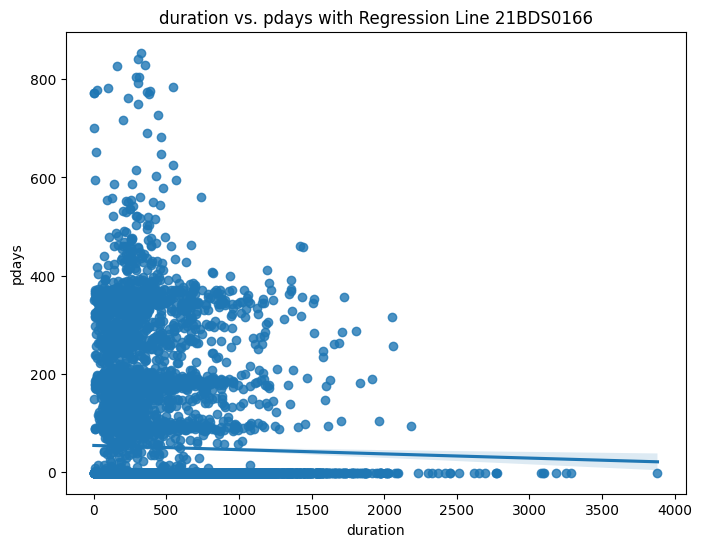

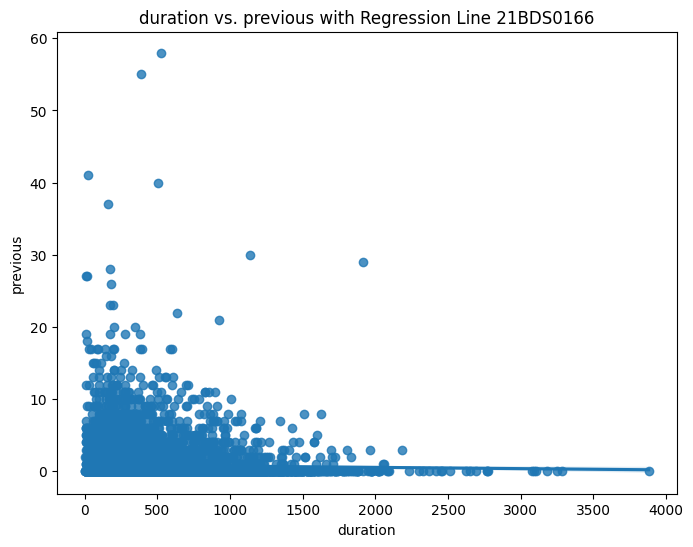

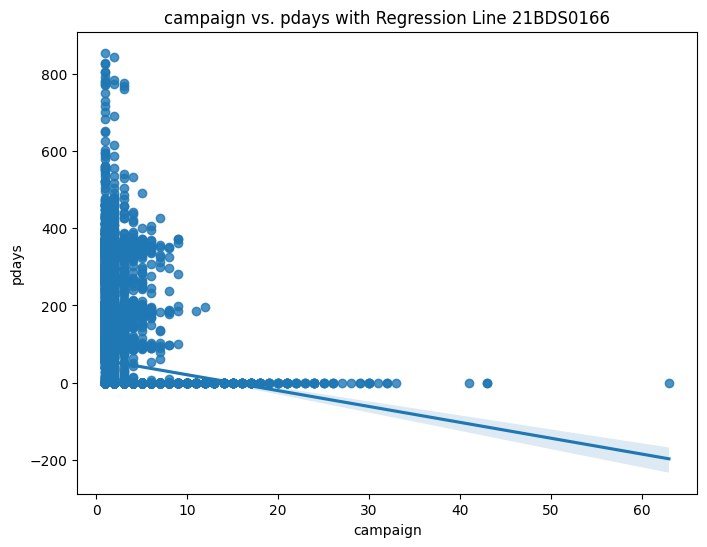

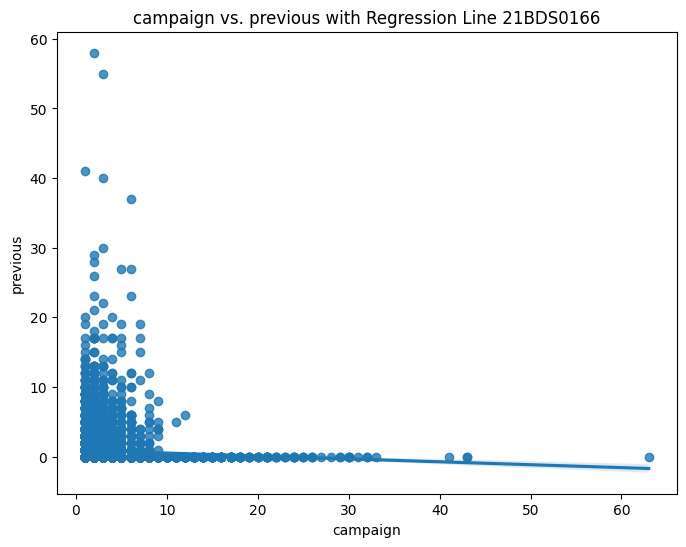

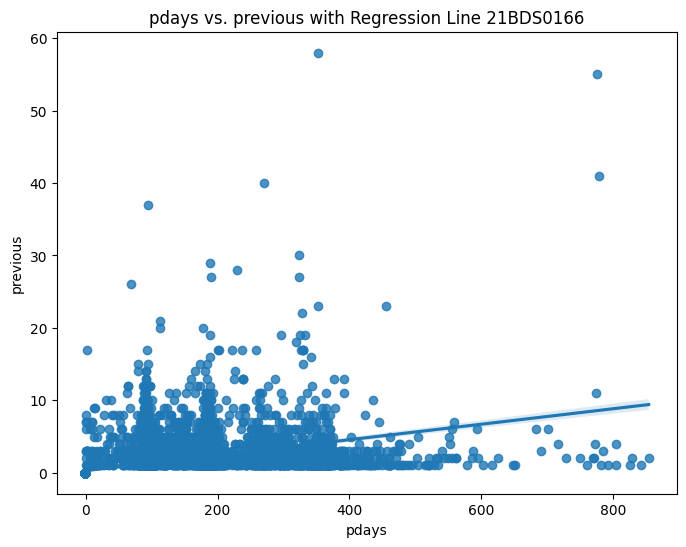

In [65]:
# Bivariate Analysis
# Numerical vs. Numerical
for i in range(0, len(num_cols)):
    for j in range(i + 1, len(num_cols)):
        plt.figure(figsize=(8, 6))
        sns.regplot(x=df[num_cols[i]], y=df[num_cols[j]])
        plt.title(f'{num_cols[i]} vs. {num_cols[j]} with Regression Line 21BDS0166')
        plt.show()

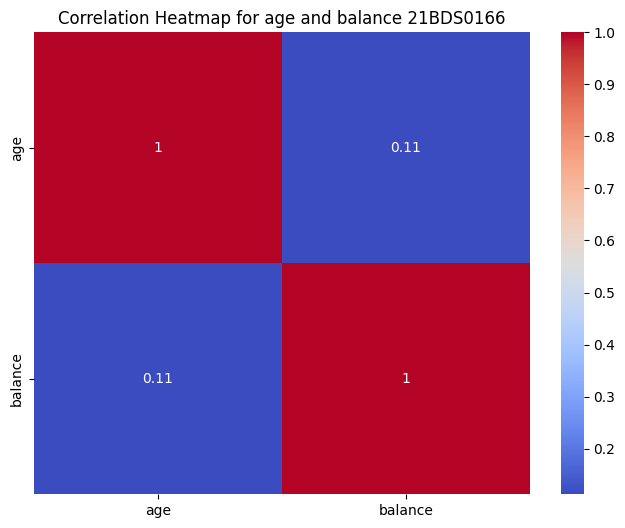

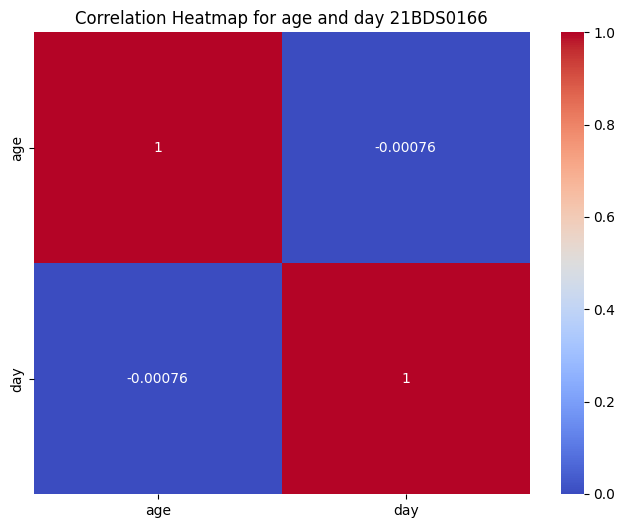

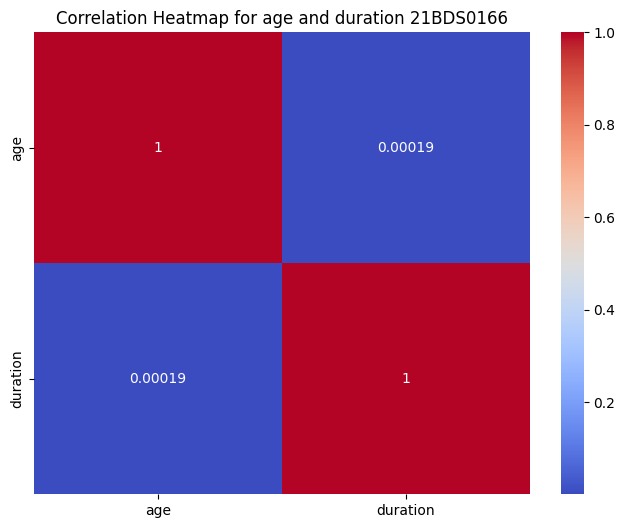

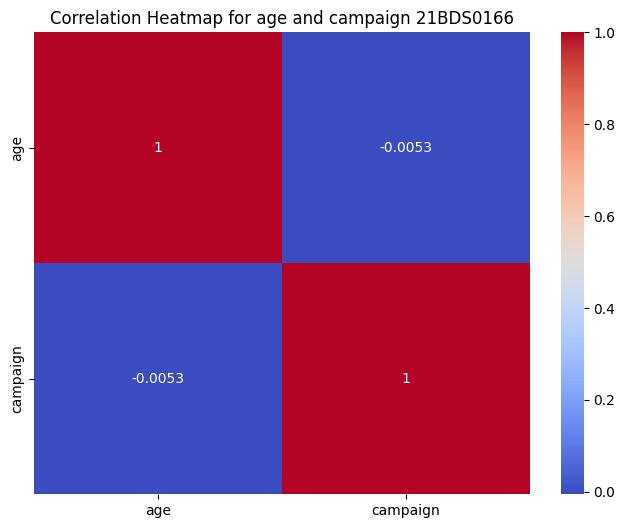

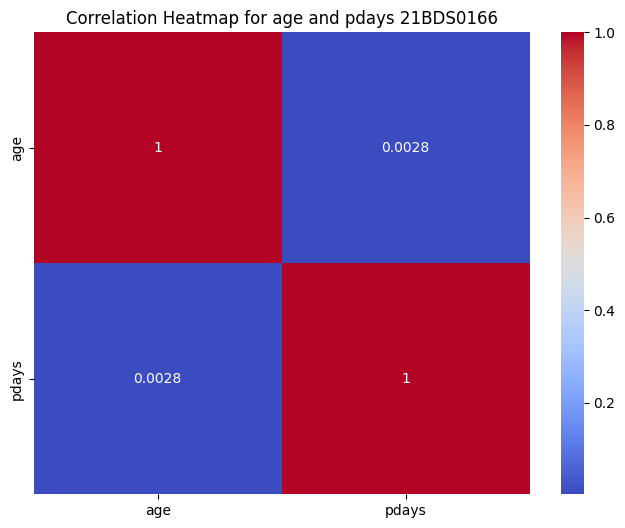

...

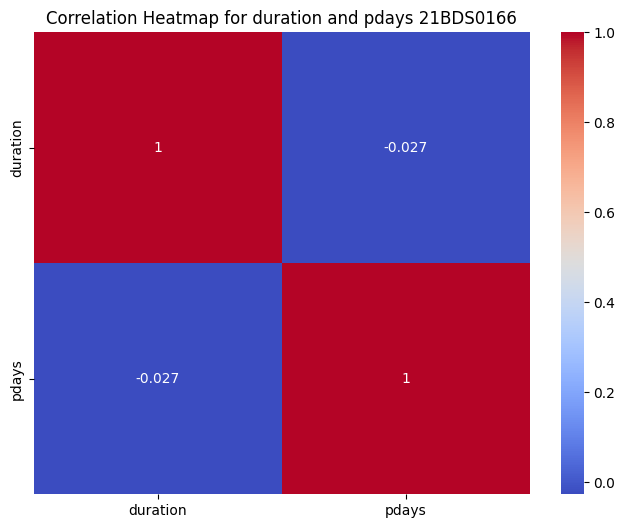

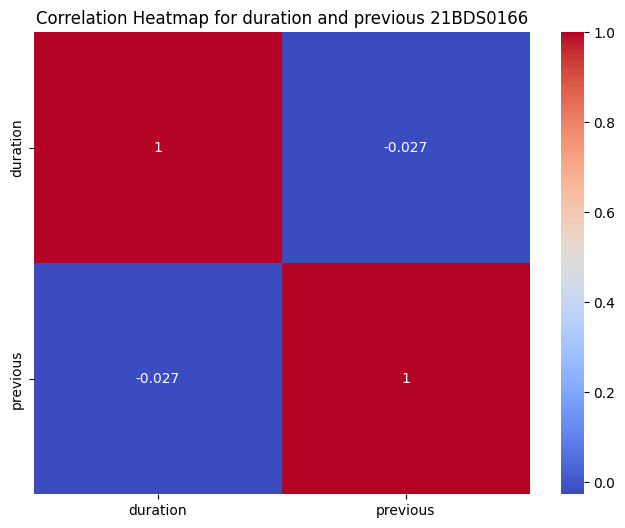

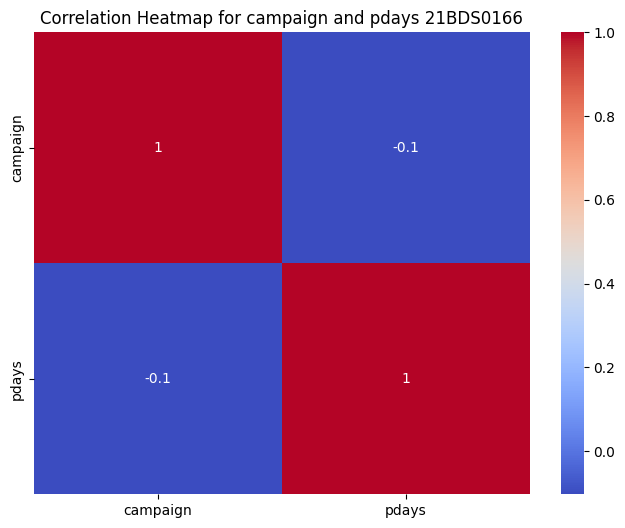

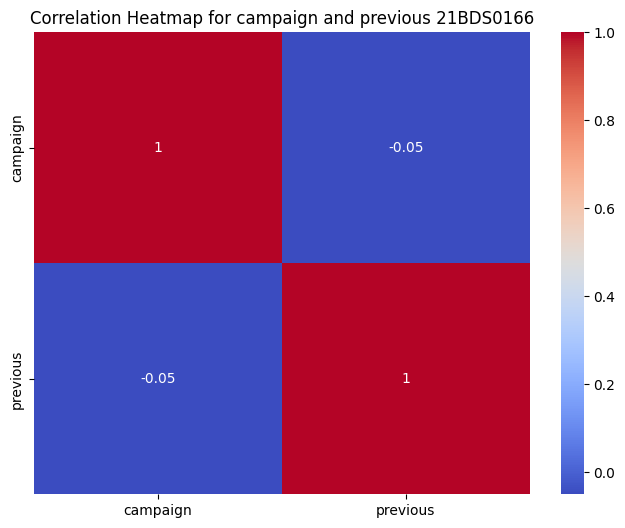

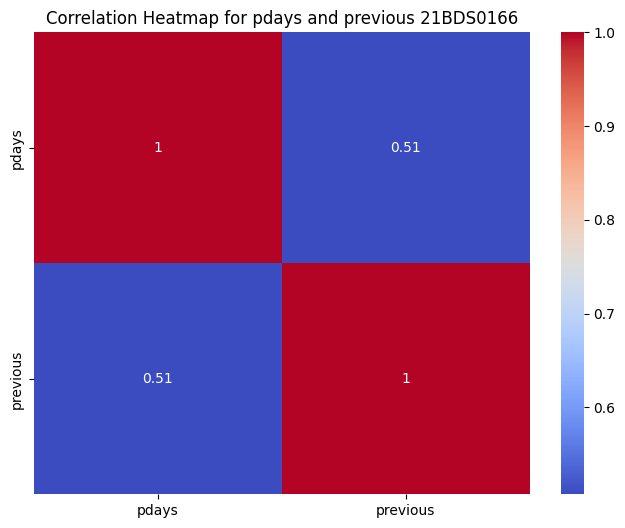

In [66]:
# Bivariate Analysis
# Numerical vs. Numerical
for i in range(0, len(num_cols)):
    for j in range(i + 1, len(num_cols)):
        plt.figure(figsize=(8, 6))
        sns.heatmap(df[[num_cols[i], num_cols[j]]].corr(), annot=True, cmap='coolwarm')
        plt.title(f'Correlation Heatmap for {num_cols[i]} and {num_cols[j]} 21BDS0166')
        plt.show()

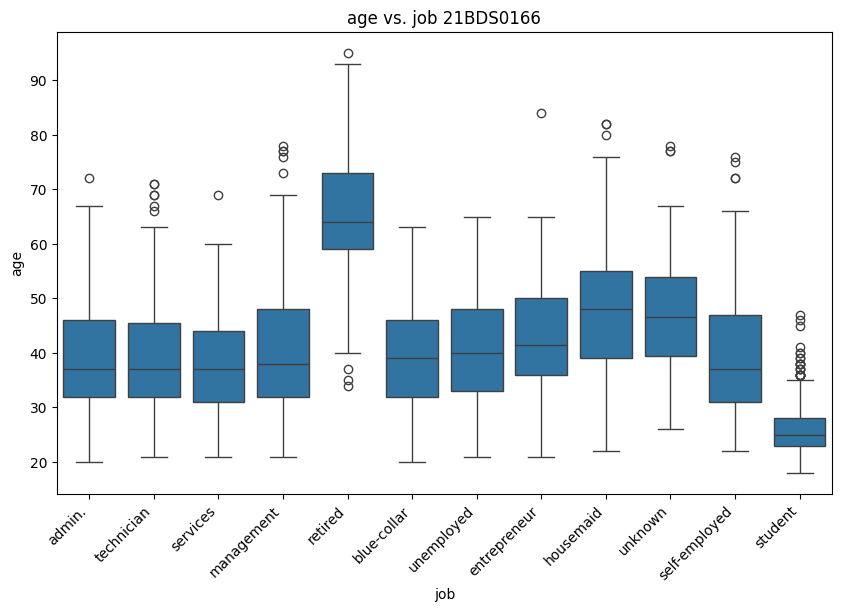

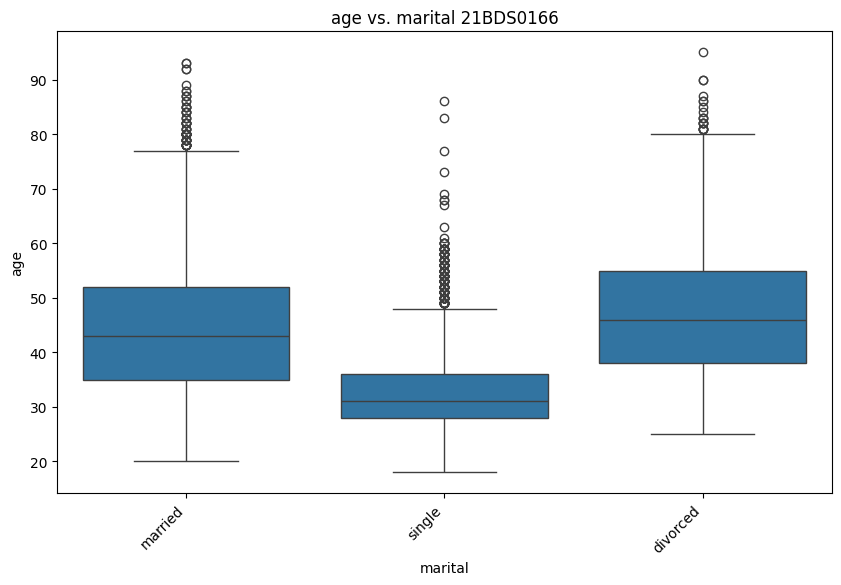

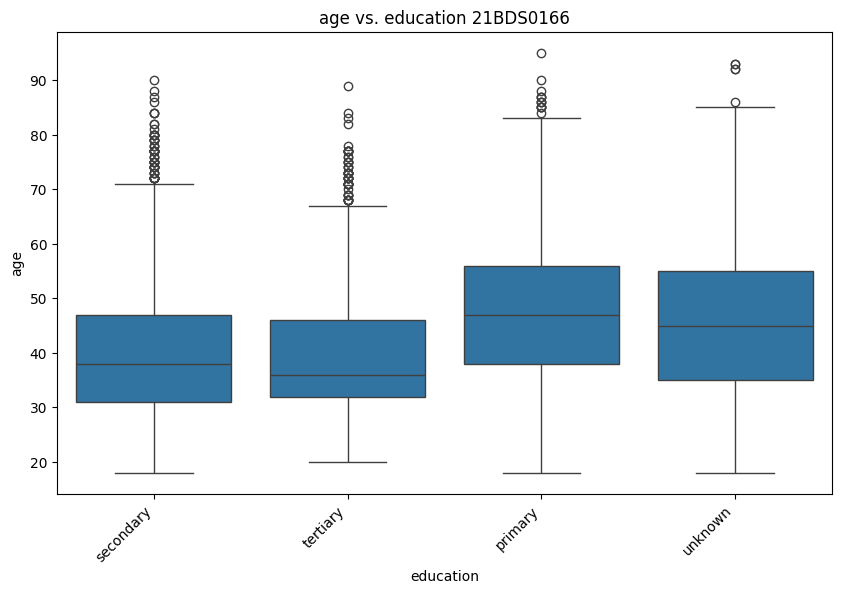

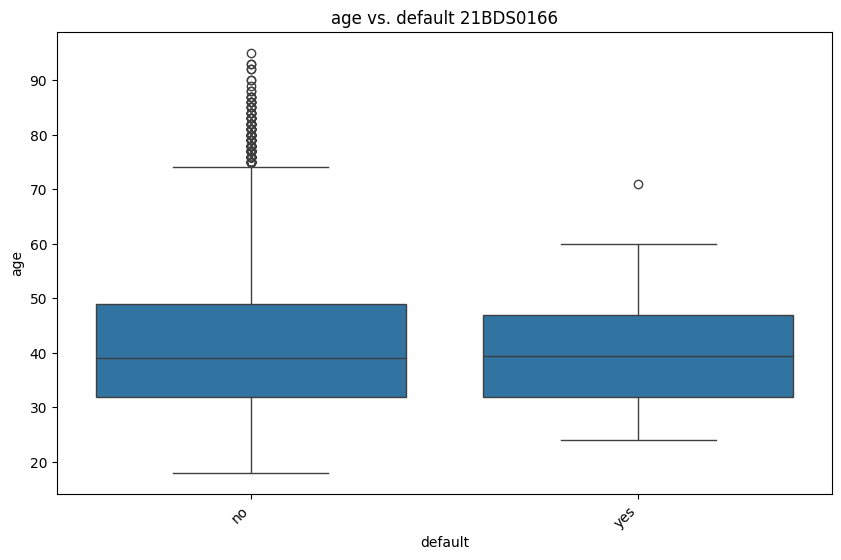

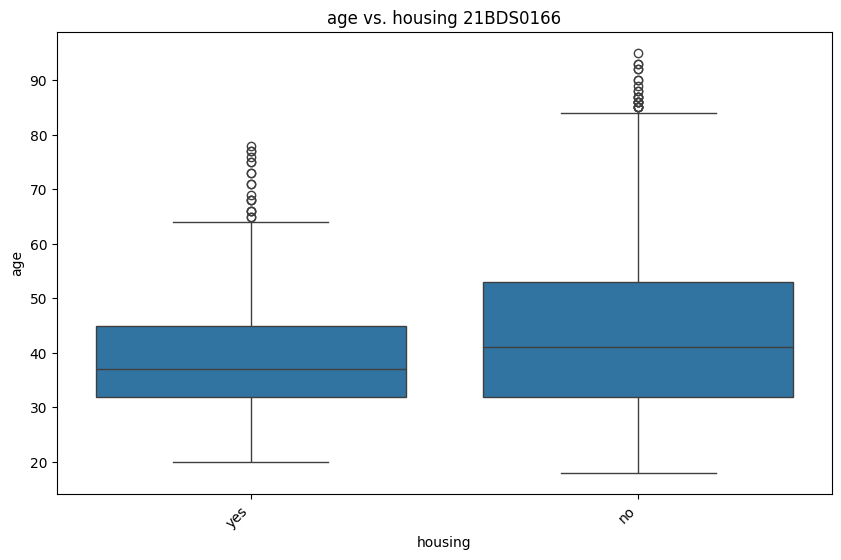

...

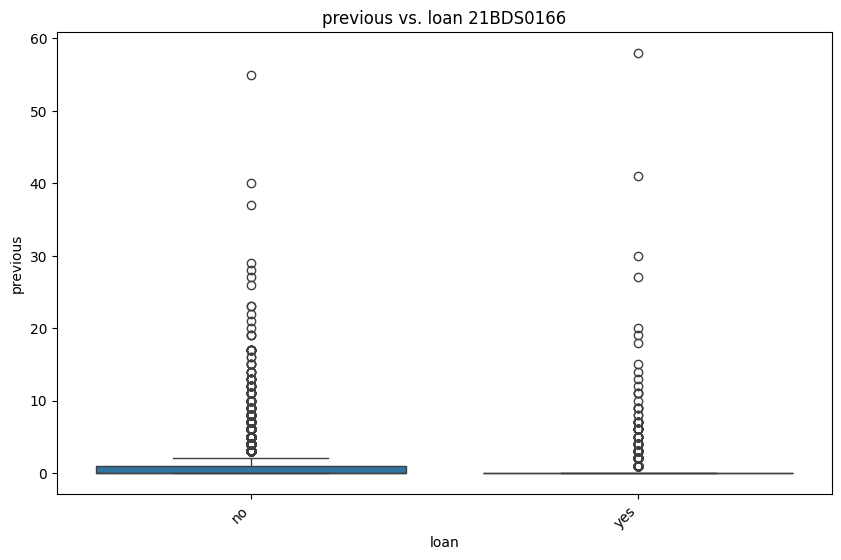

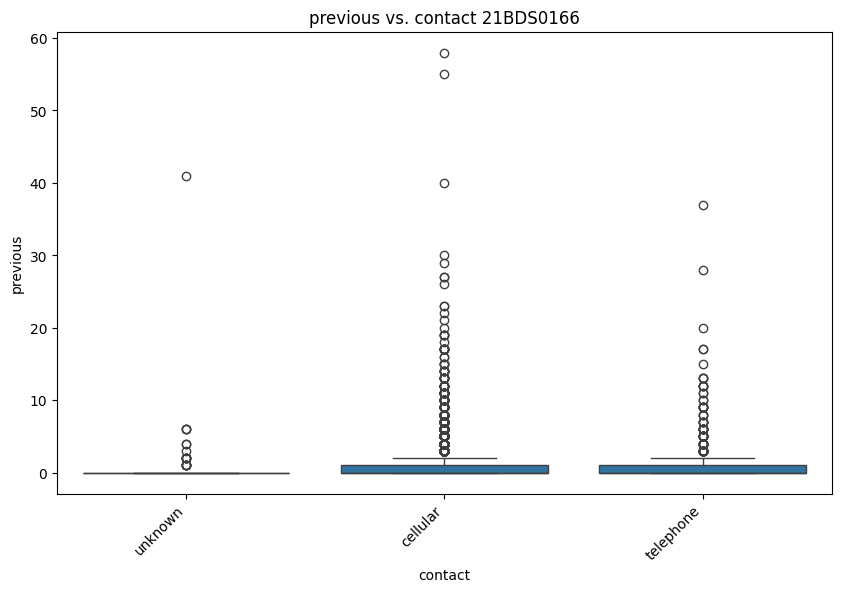

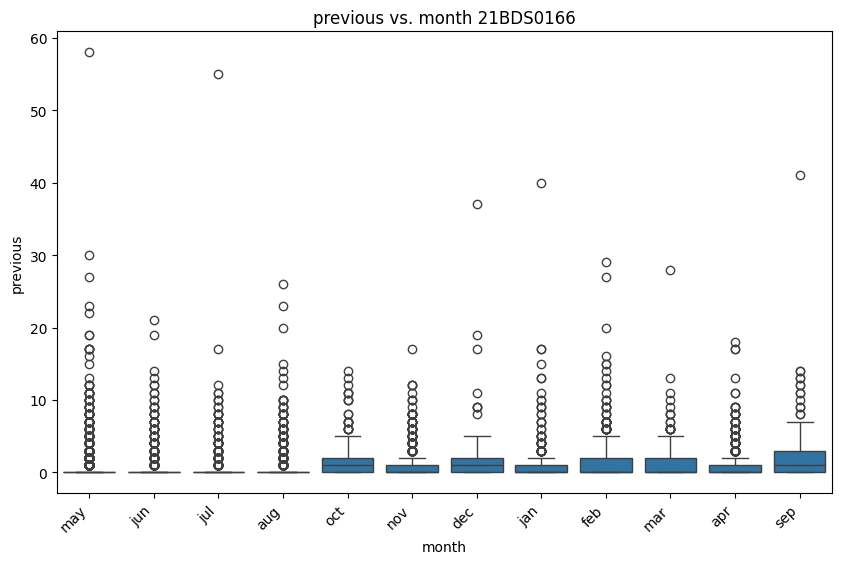

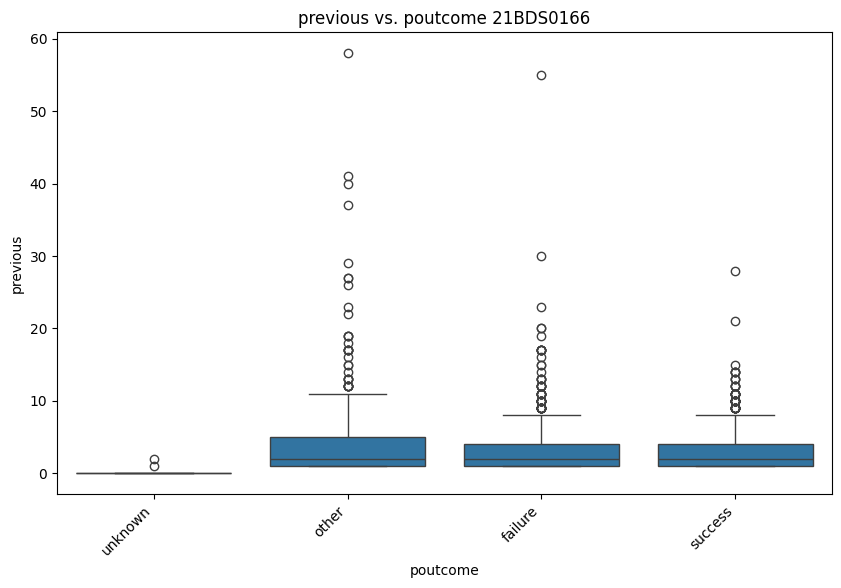

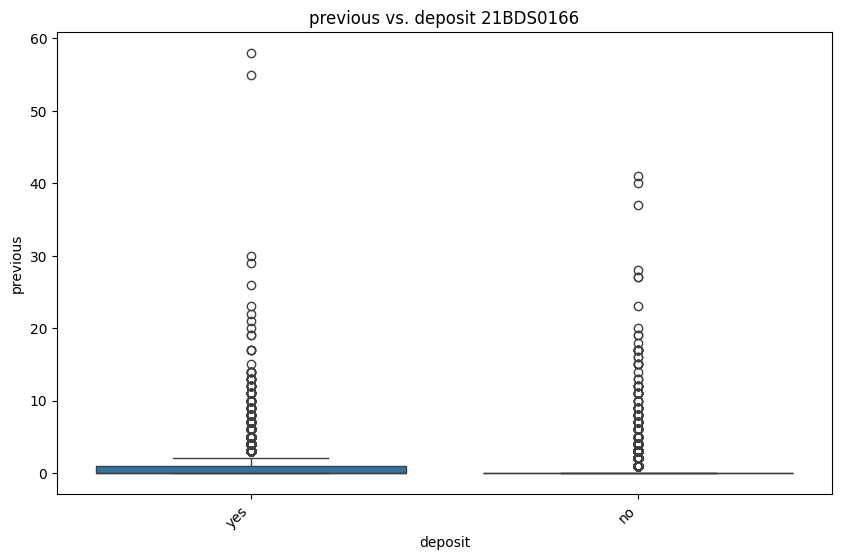

In [67]:
# Bivariate Analysis
# Numerical vs. Categorical
# Boxplot
for num_col in num_cols:
    for cat_col in cat_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=df[cat_col], y=df[num_col])
        plt.title(f'{num_col} vs. {cat_col} 21BDS0166')
        plt.xticks(rotation=45, ha='right')
        plt.show()

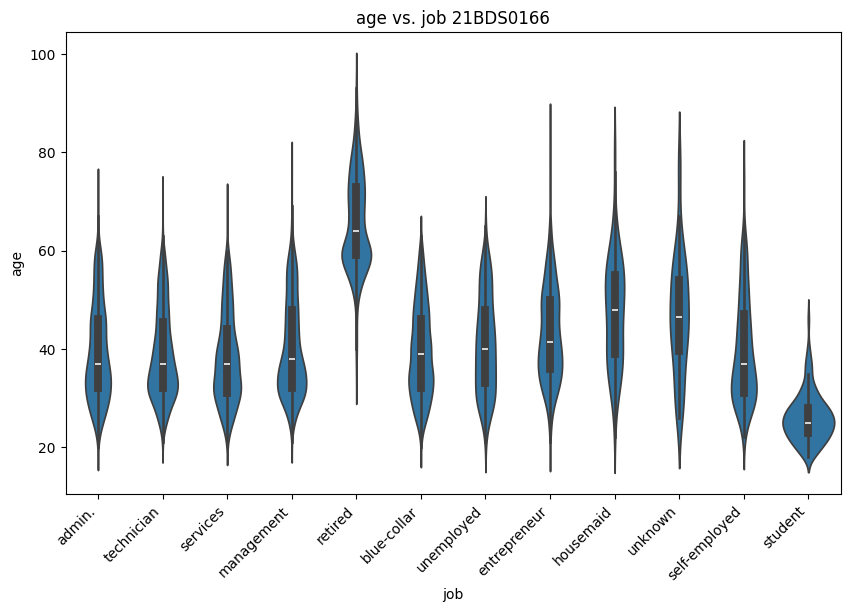

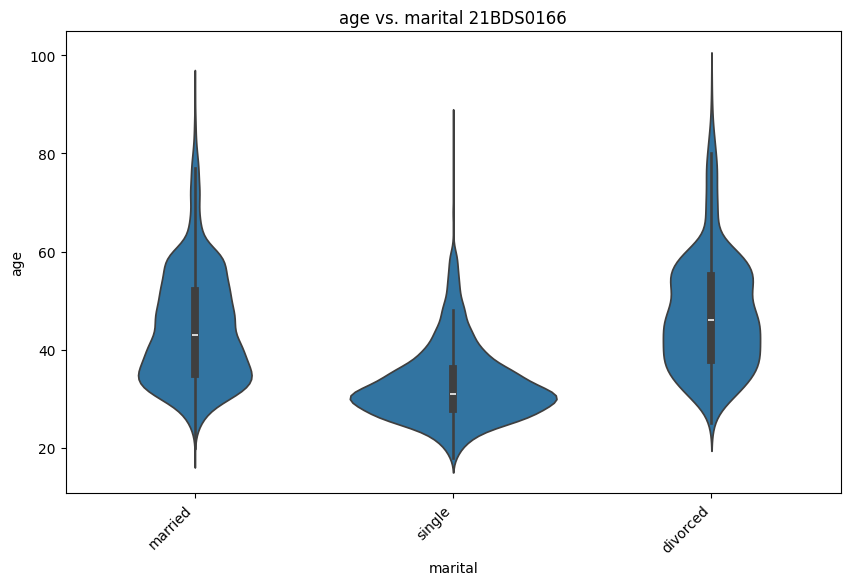

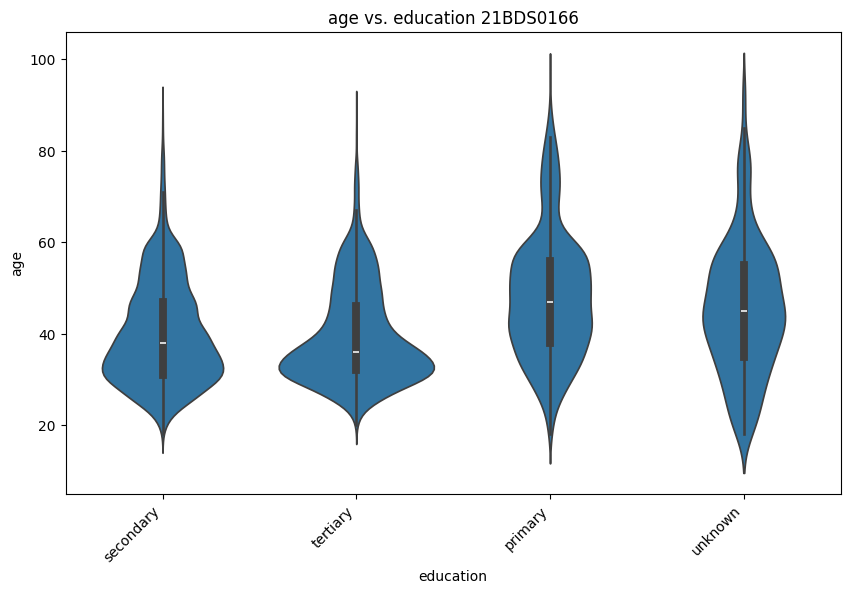

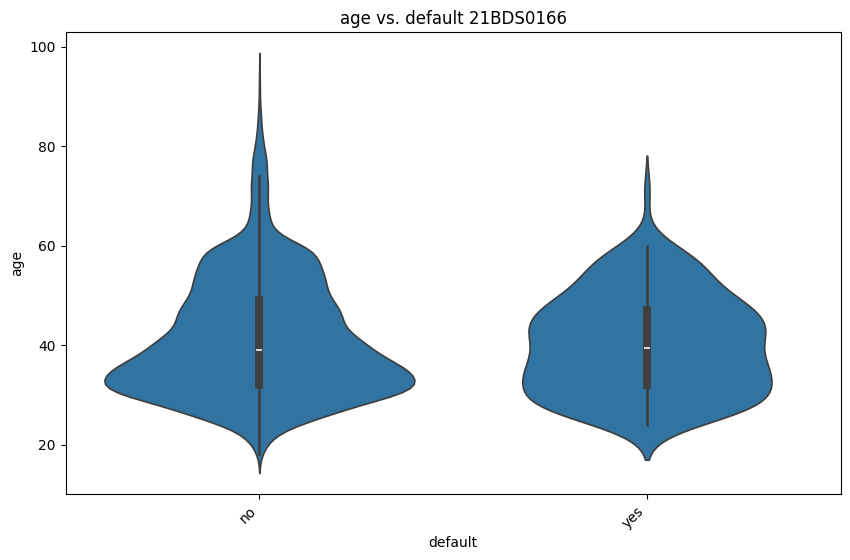

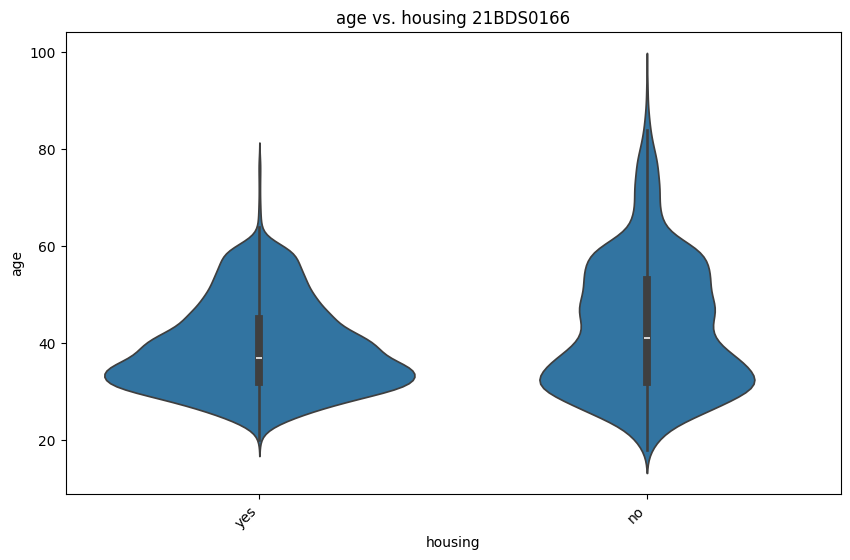

...

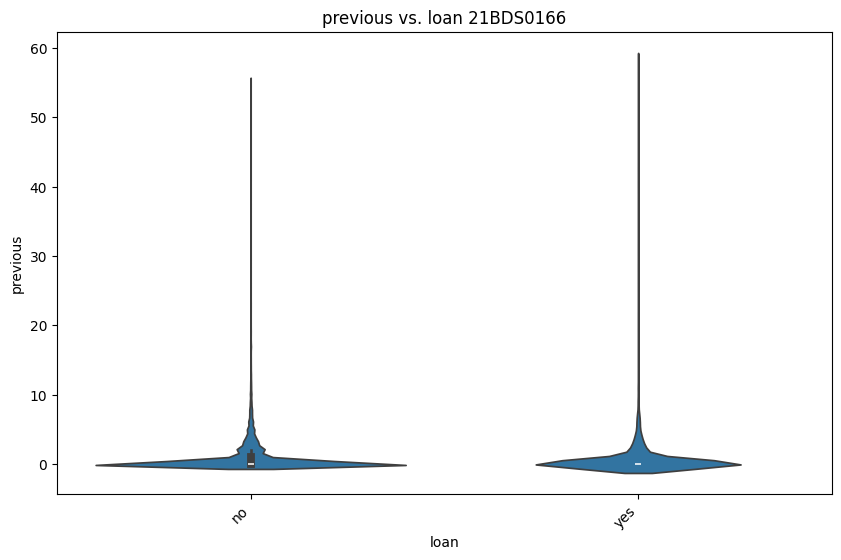

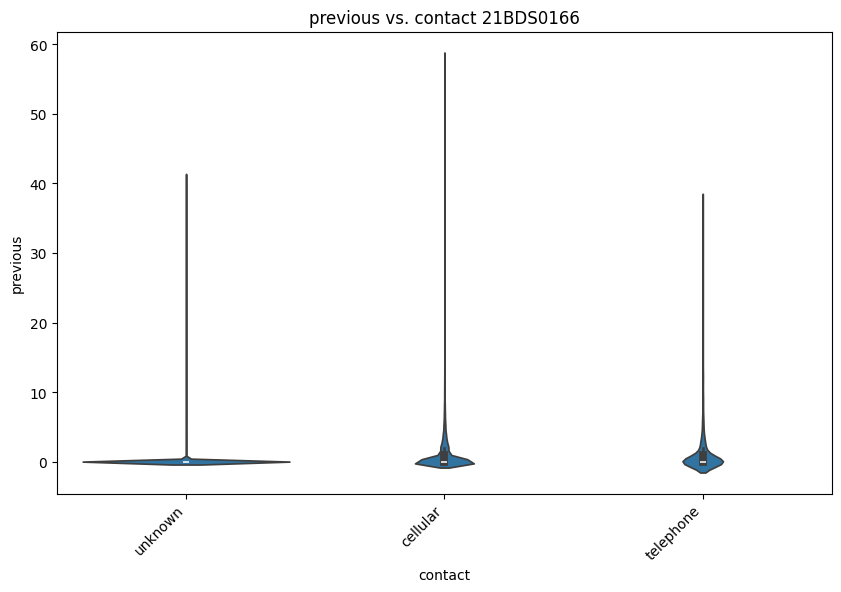

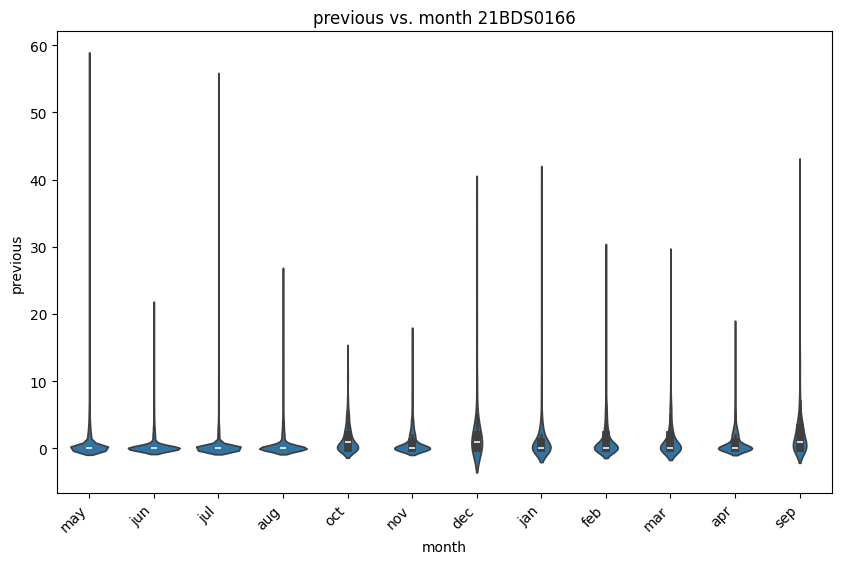

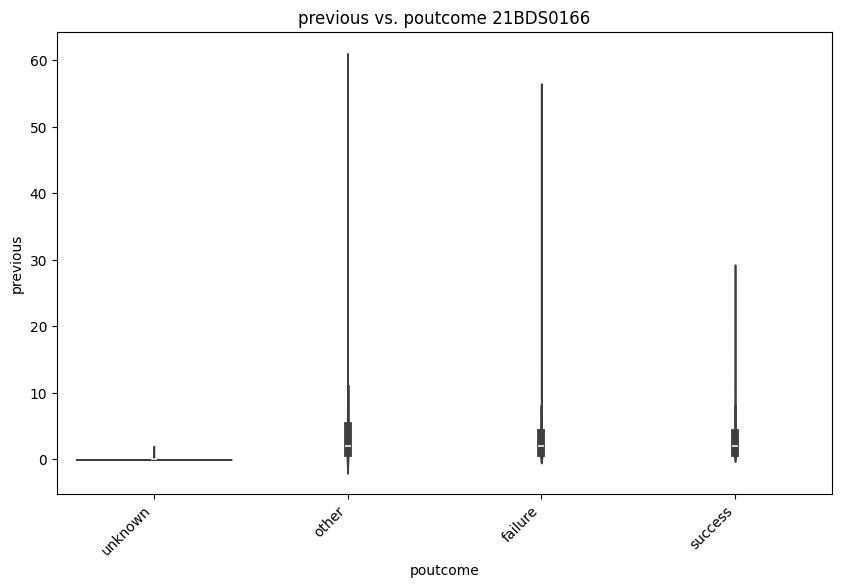

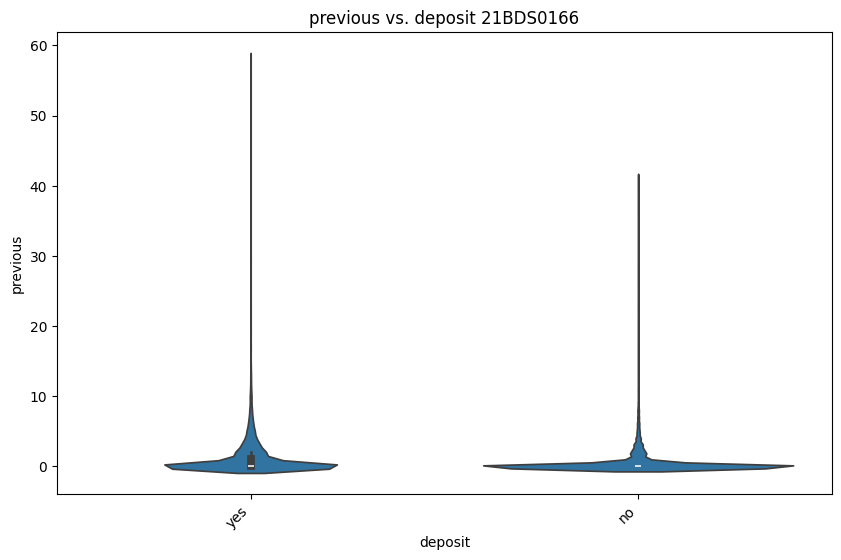

In [68]:
# Bivariate Analysis
# Numerical vs. Categorical
# Violin Plot
for num_col in num_cols:
    for cat_col in cat_cols:
        plt.figure(figsize=(10, 6))
        sns.violinplot(x=df[cat_col], y=df[num_col])
        plt.title(f'{num_col} vs. {cat_col} 21BDS0166')
        plt.xticks(rotation=45, ha='right')
        plt.show()

<Figure size 1000x600 with 0 Axes>

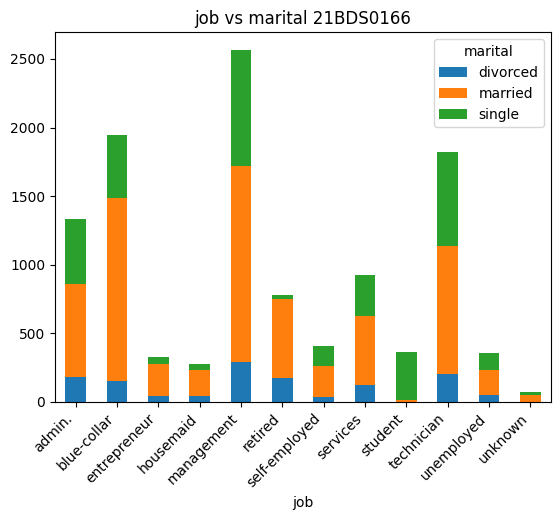

<Figure size 1000x600 with 0 Axes>

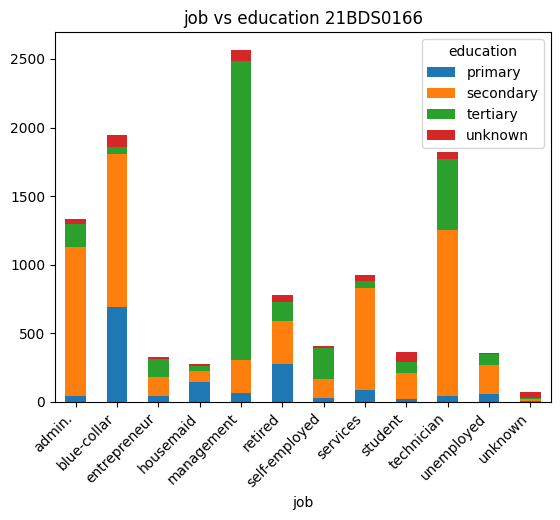

<Figure size 1000x600 with 0 Axes>

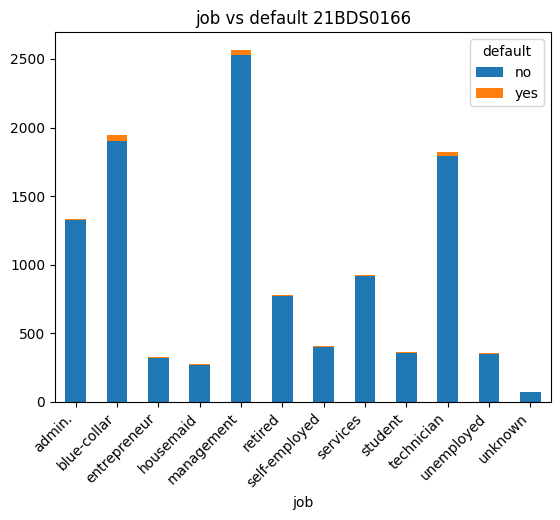

<Figure size 1000x600 with 0 Axes>

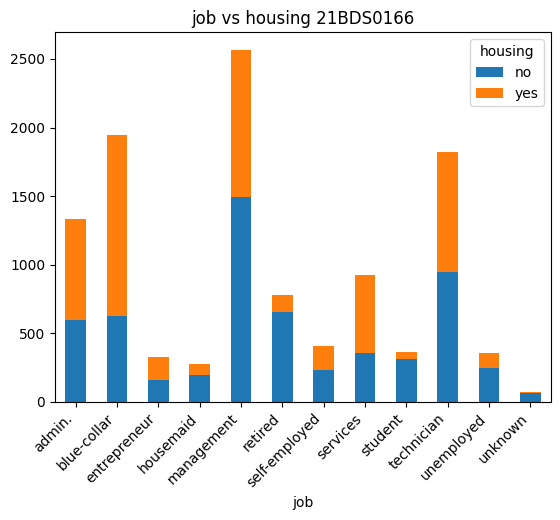

<Figure size 1000x600 with 0 Axes>

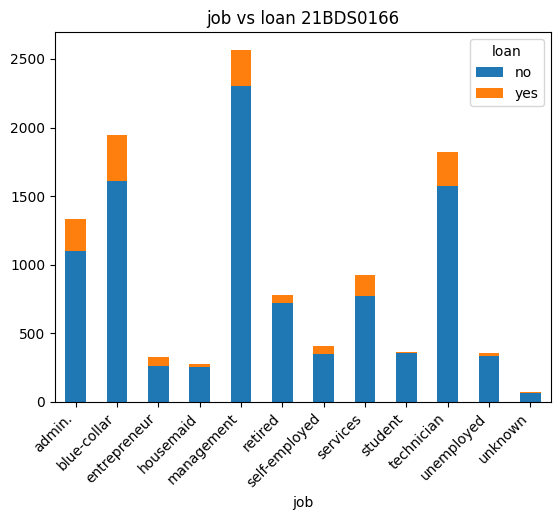

<Figure size 1000x600 with 0 Axes>

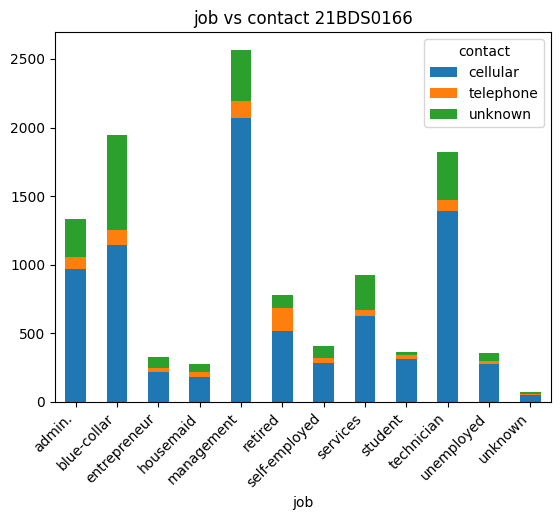

<Figure size 1000x600 with 0 Axes>

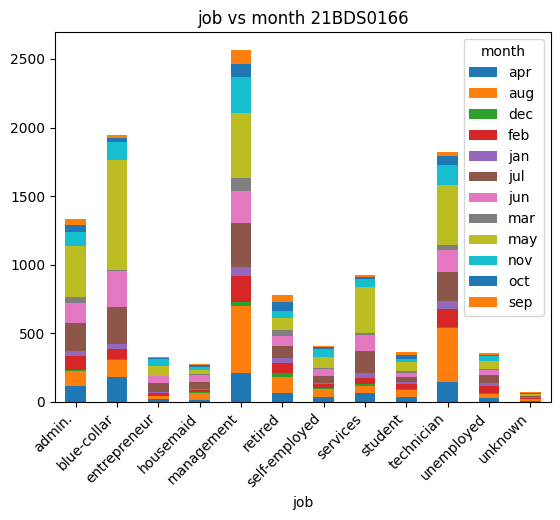

<Figure size 1000x600 with 0 Axes>

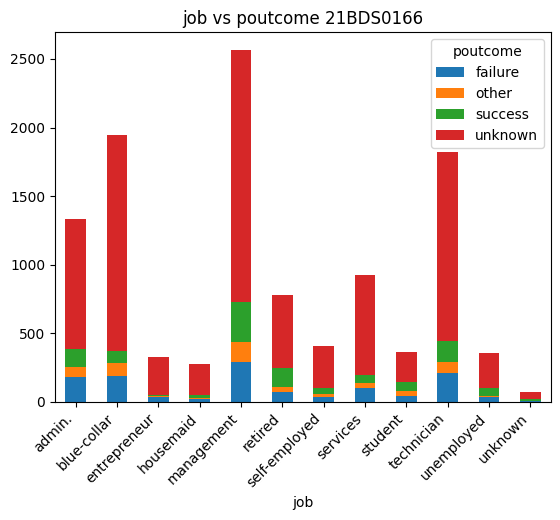

<Figure size 1000x600 with 0 Axes>

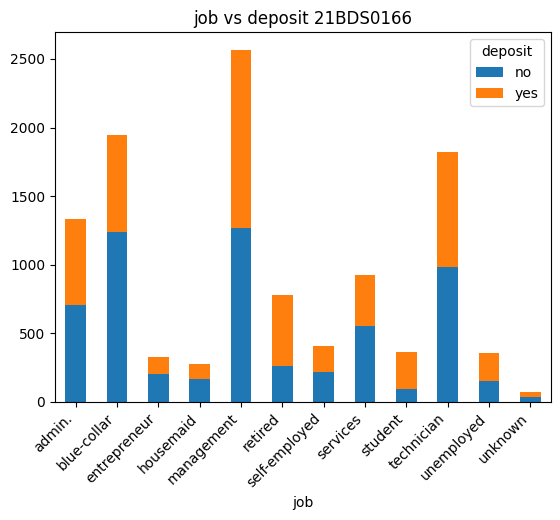

<Figure size 1000x600 with 0 Axes>

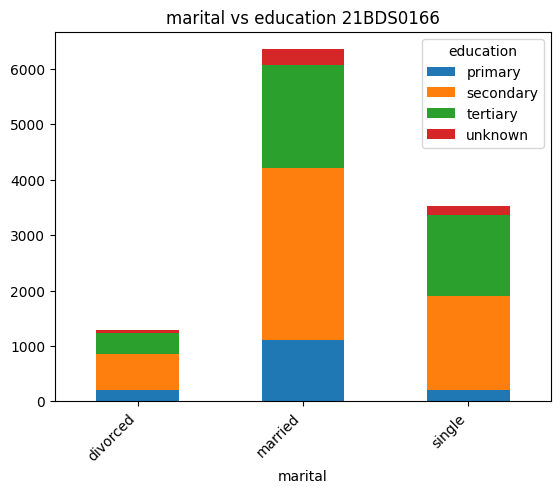

<Figure size 1000x600 with 0 Axes>

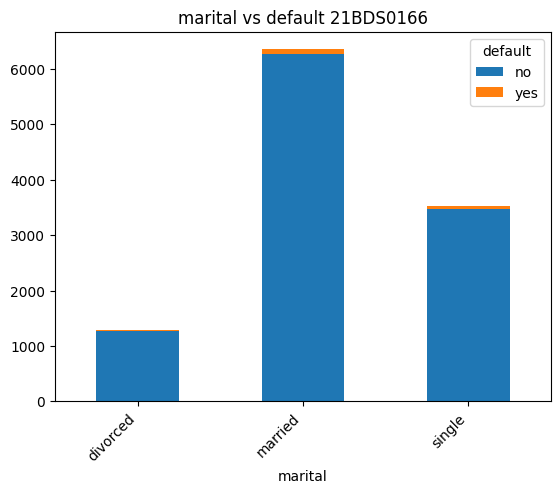

<Figure size 1000x600 with 0 Axes>

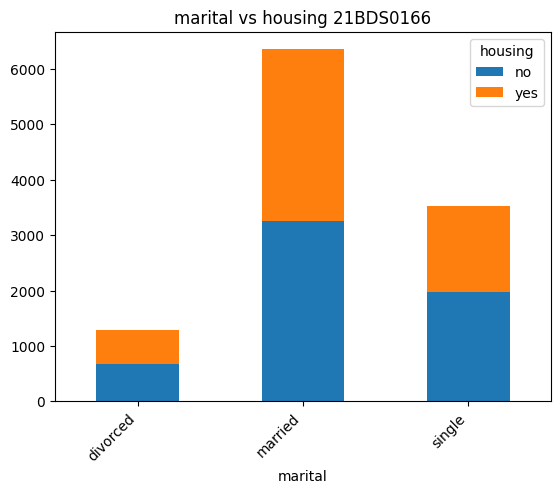

<Figure size 1000x600 with 0 Axes>

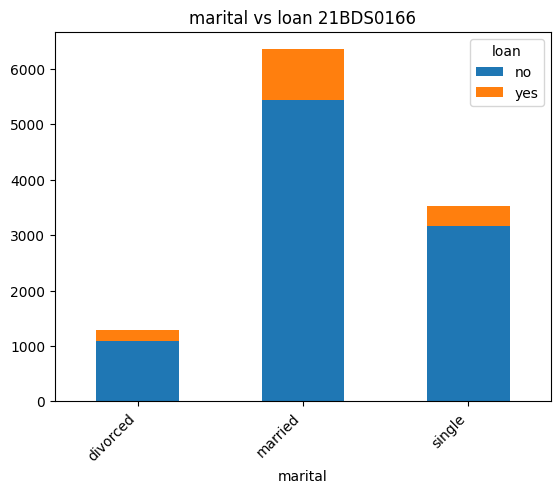

<Figure size 1000x600 with 0 Axes>

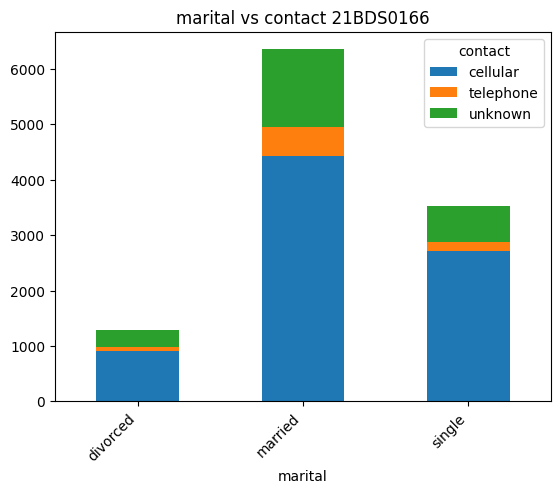

<Figure size 1000x600 with 0 Axes>

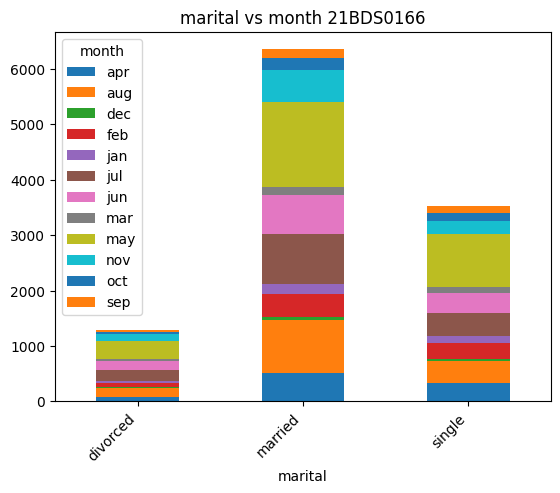

<Figure size 1000x600 with 0 Axes>

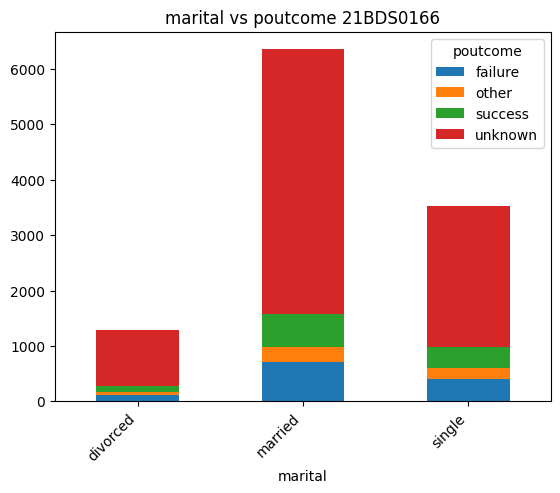

<Figure size 1000x600 with 0 Axes>

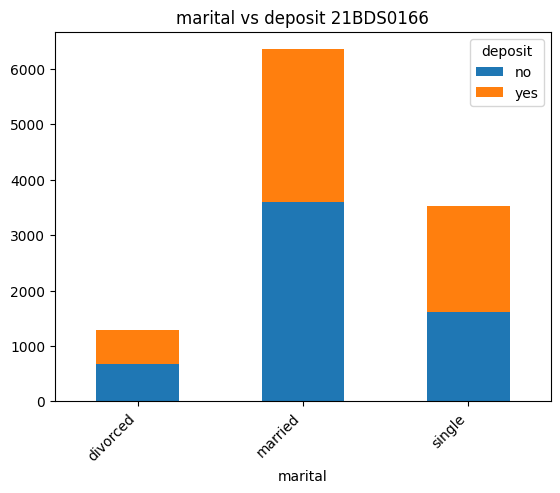

<Figure size 1000x600 with 0 Axes>

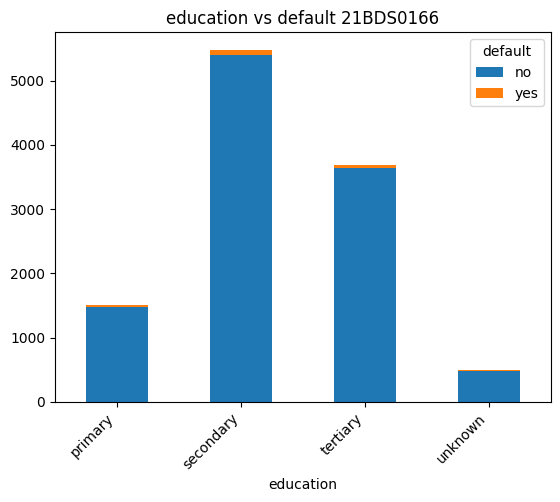

<Figure size 1000x600 with 0 Axes>

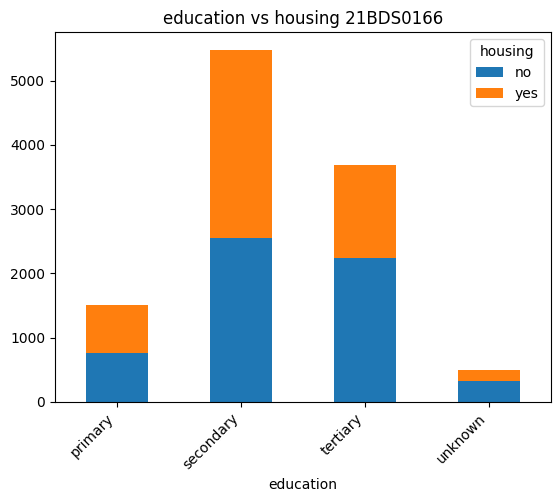

<Figure size 1000x600 with 0 Axes>

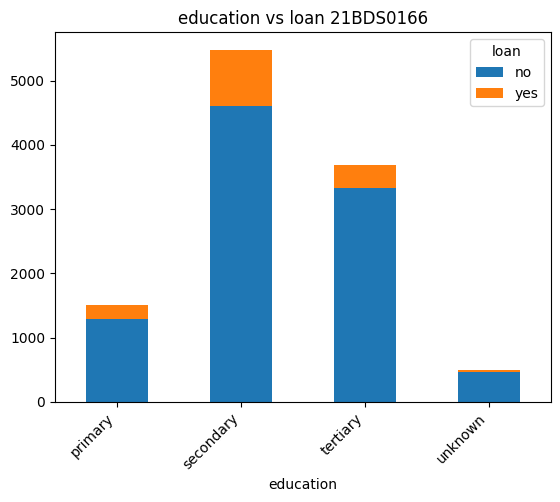

<Figure size 1000x600 with 0 Axes>

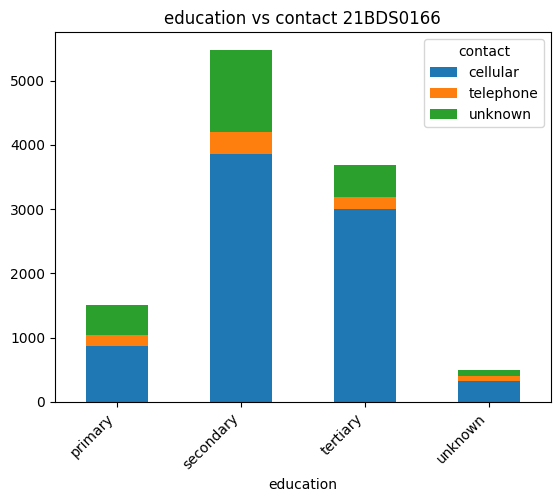

<Figure size 1000x600 with 0 Axes>

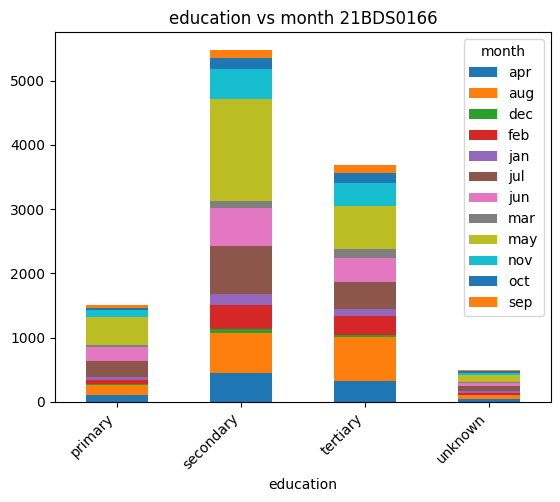

<Figure size 1000x600 with 0 Axes>

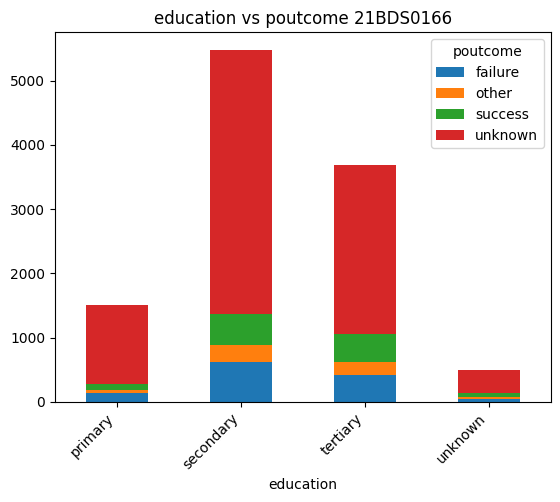

<Figure size 1000x600 with 0 Axes>

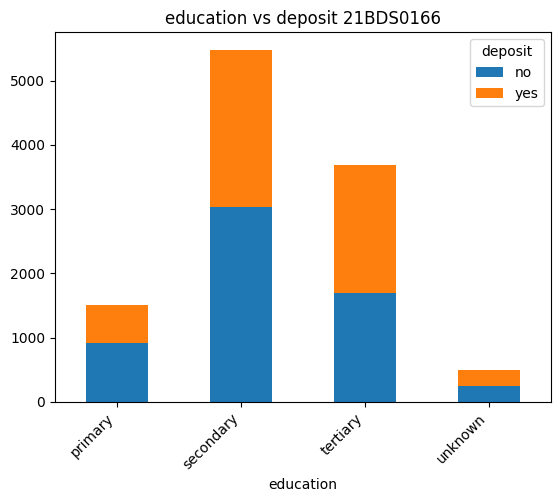

<Figure size 1000x600 with 0 Axes>

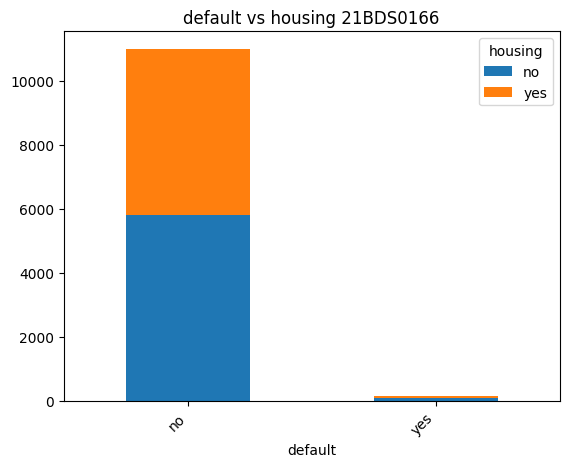

<Figure size 1000x600 with 0 Axes>

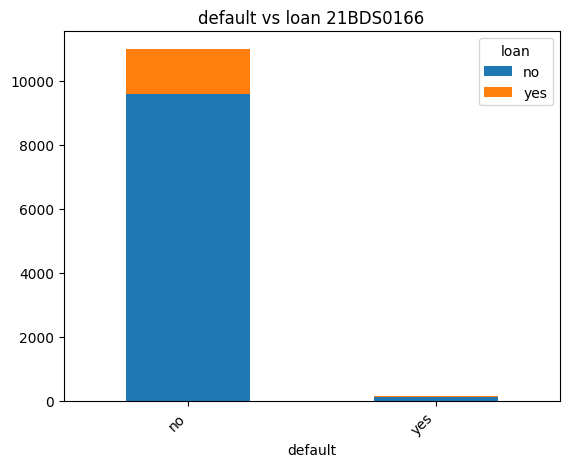

<Figure size 1000x600 with 0 Axes>

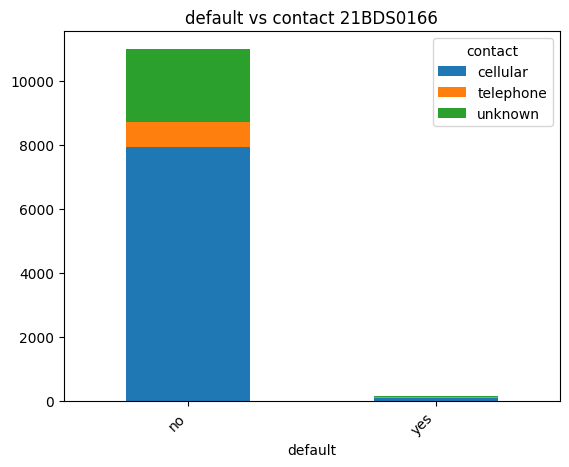

<Figure size 1000x600 with 0 Axes>

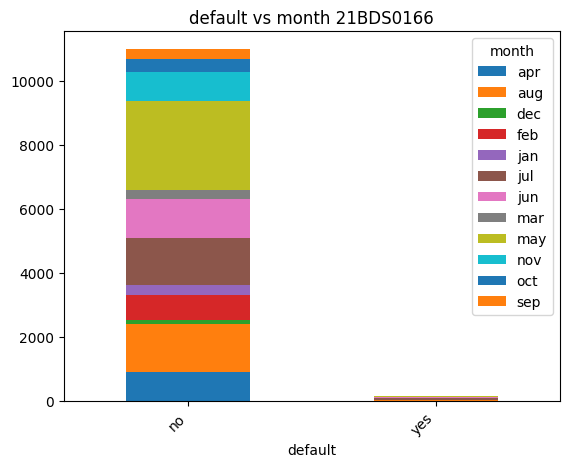

<Figure size 1000x600 with 0 Axes>

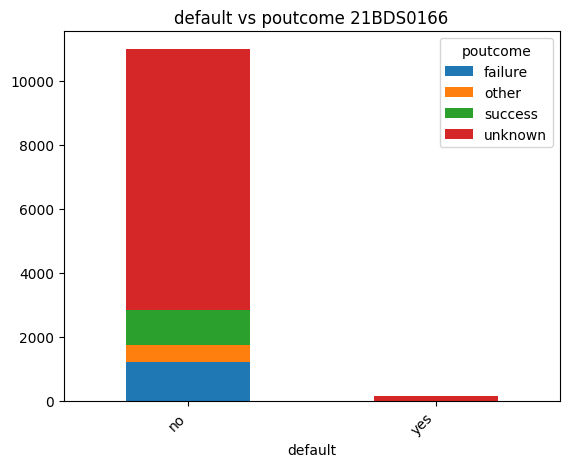

<Figure size 1000x600 with 0 Axes>

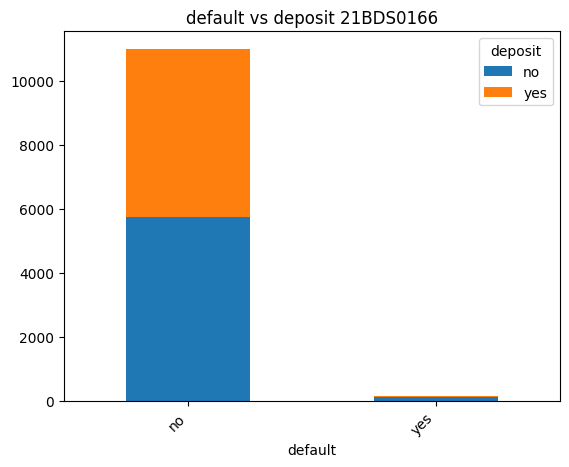

<Figure size 1000x600 with 0 Axes>

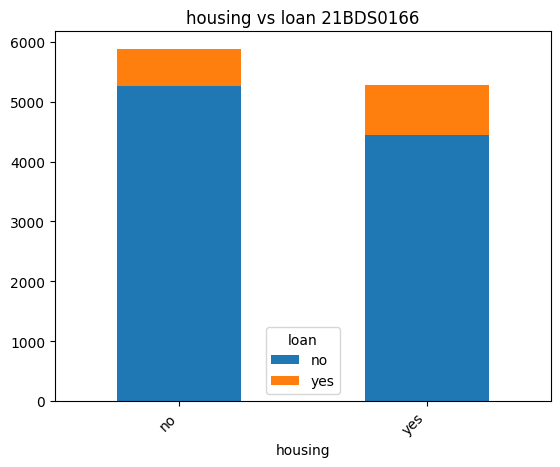

<Figure size 1000x600 with 0 Axes>

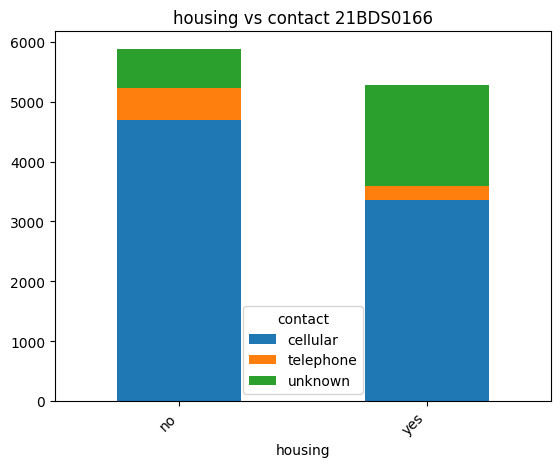

<Figure size 1000x600 with 0 Axes>

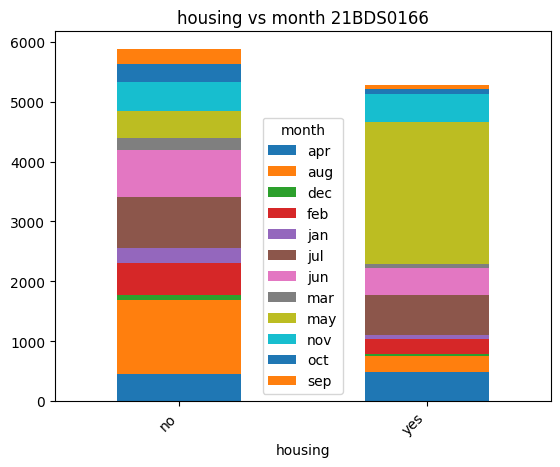

<Figure size 1000x600 with 0 Axes>

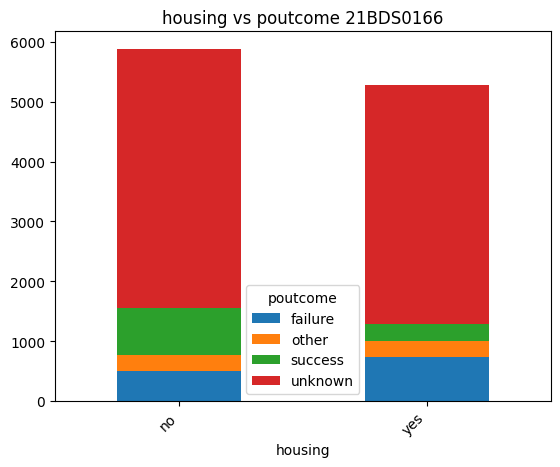

<Figure size 1000x600 with 0 Axes>

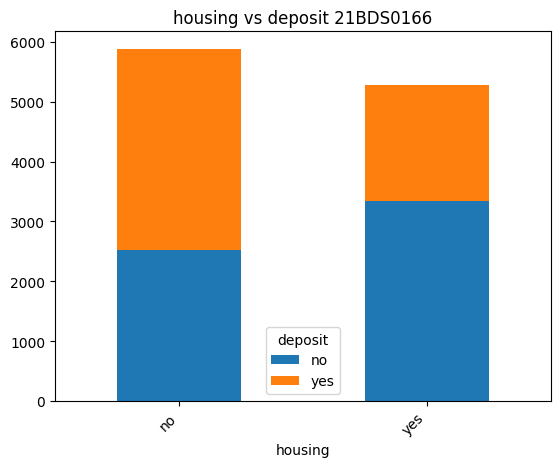

<Figure size 1000x600 with 0 Axes>

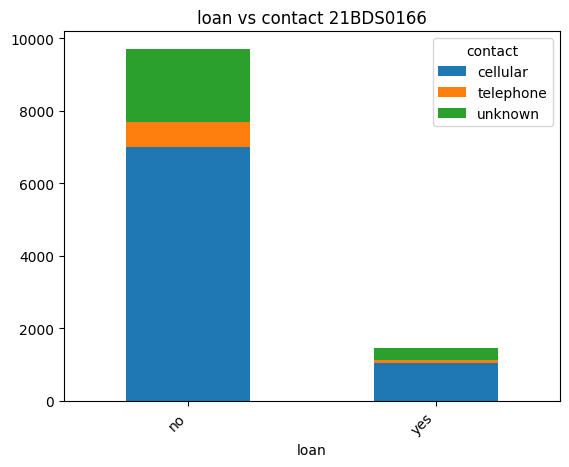

<Figure size 1000x600 with 0 Axes>

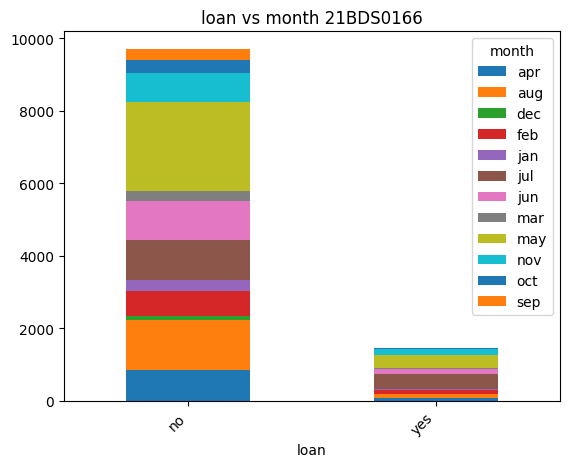

<Figure size 1000x600 with 0 Axes>

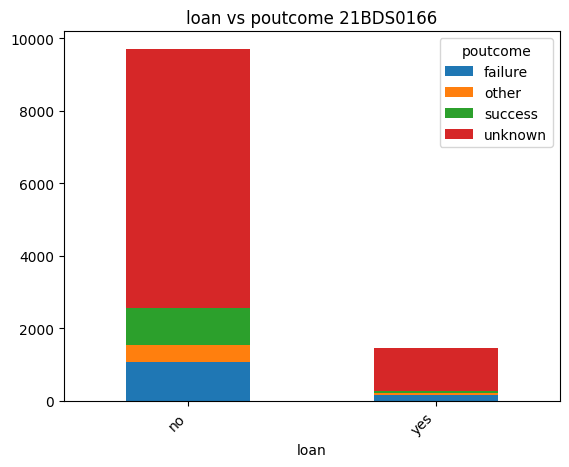

<Figure size 1000x600 with 0 Axes>

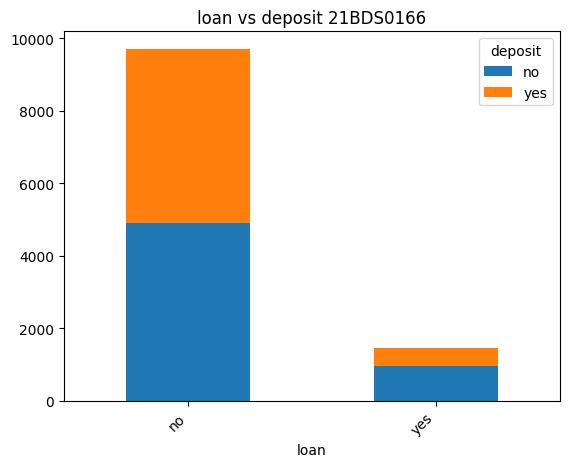

<Figure size 1000x600 with 0 Axes>

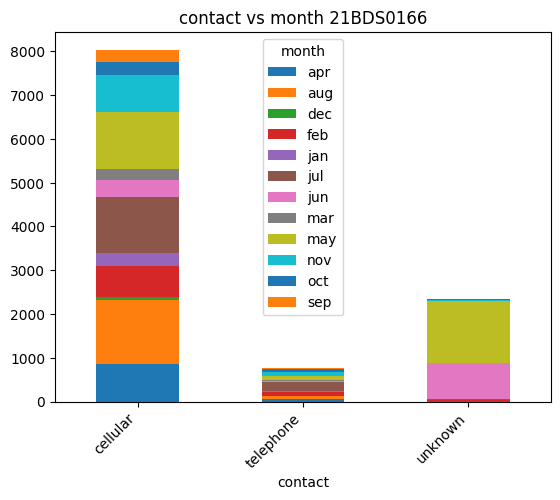

<Figure size 1000x600 with 0 Axes>

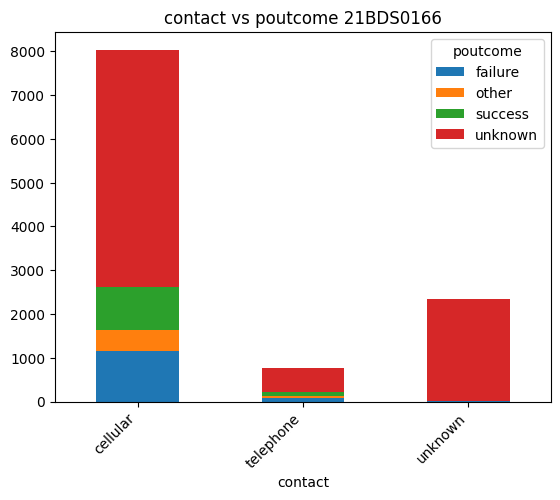

<Figure size 1000x600 with 0 Axes>

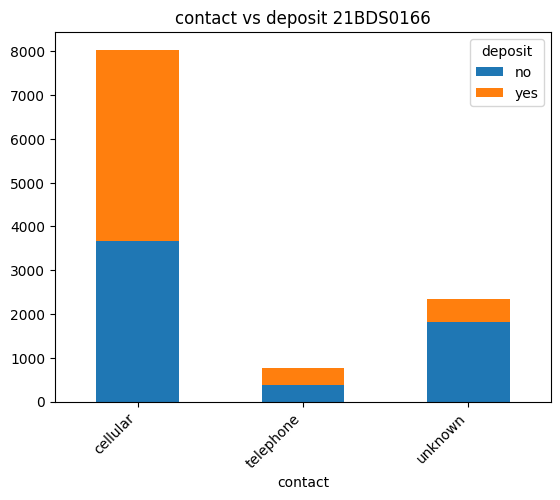

<Figure size 1000x600 with 0 Axes>

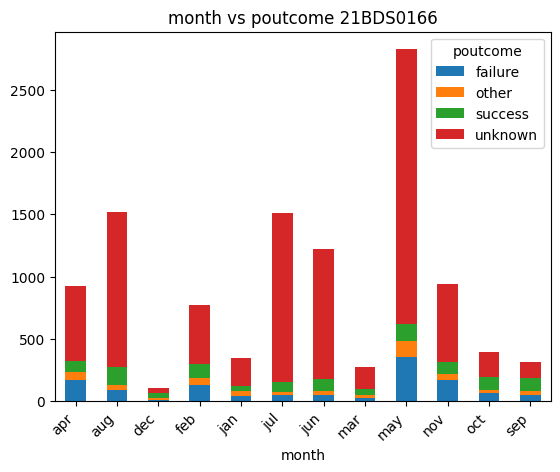

<Figure size 1000x600 with 0 Axes>

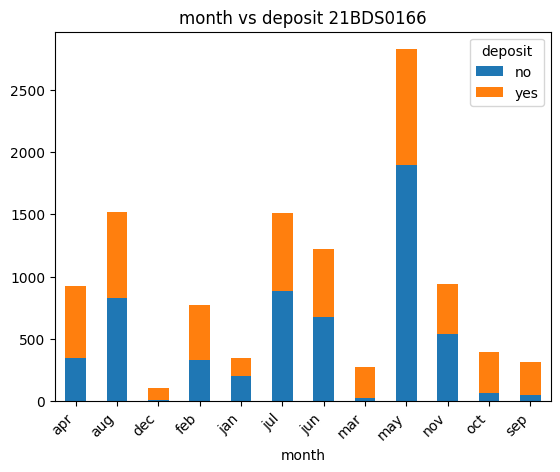

<Figure size 1000x600 with 0 Axes>

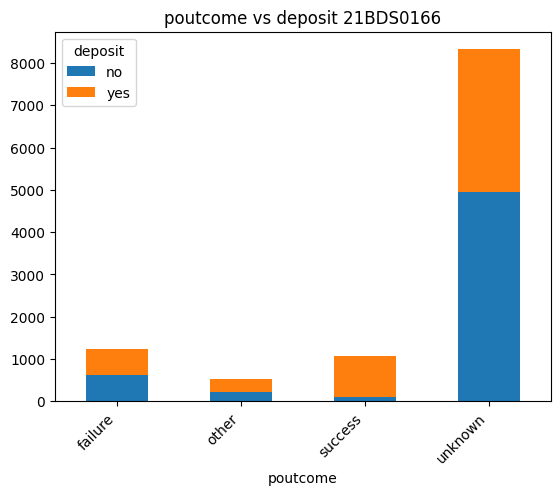

In [69]:
# Bivariate Analysis
# Categorical vs. Categorical
for i in range(0, len(cat_cols)):
    for j in range(i+1, len(cat_cols)):
      plt.figure(figsize=(10,6))
      pd.crosstab(df[cat_cols[i]], df[cat_cols[j]]).plot(kind="bar", stacked=True)
      plt.title(f'{cat_cols[i]} vs {cat_cols[j]} 21BDS0166')
      plt.xticks(rotation=45, ha="right")
      plt.show()

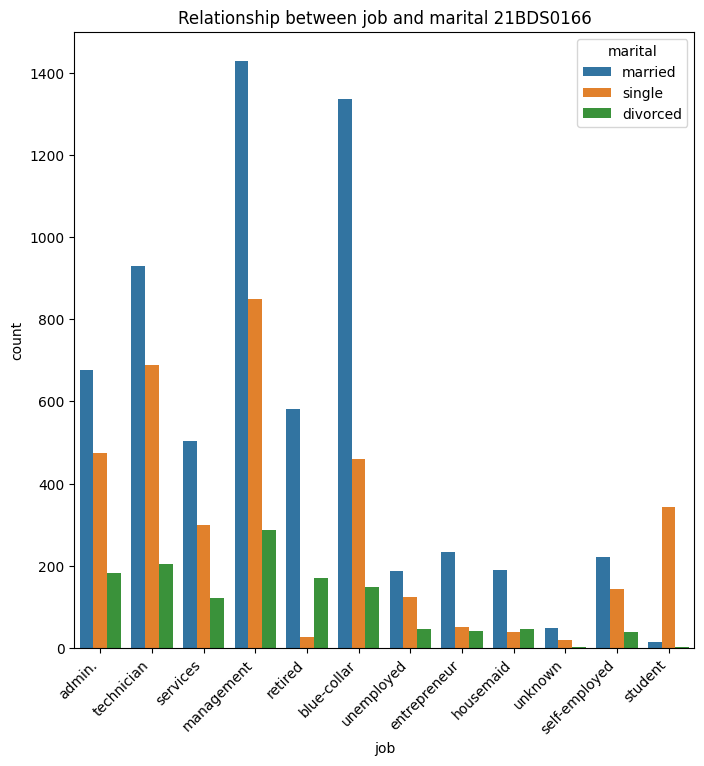

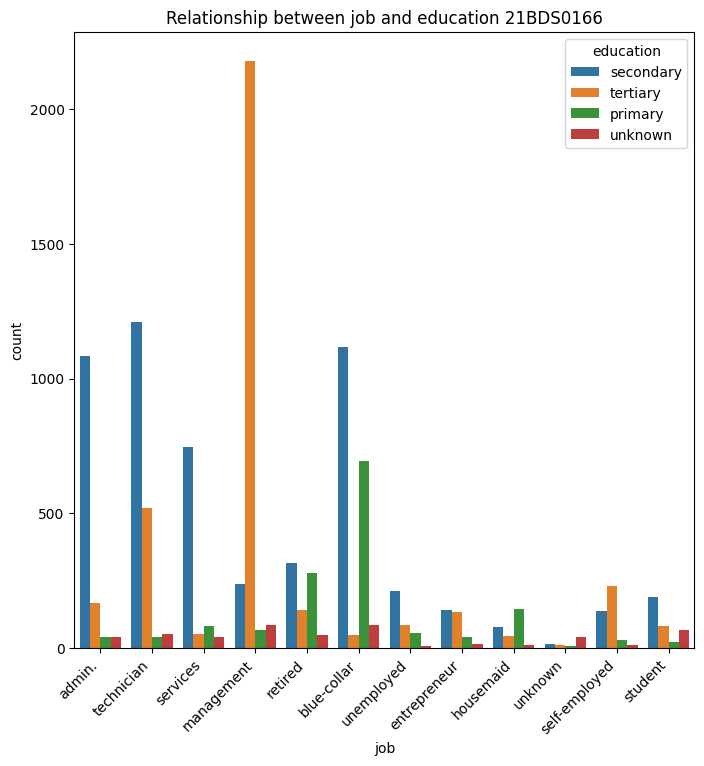

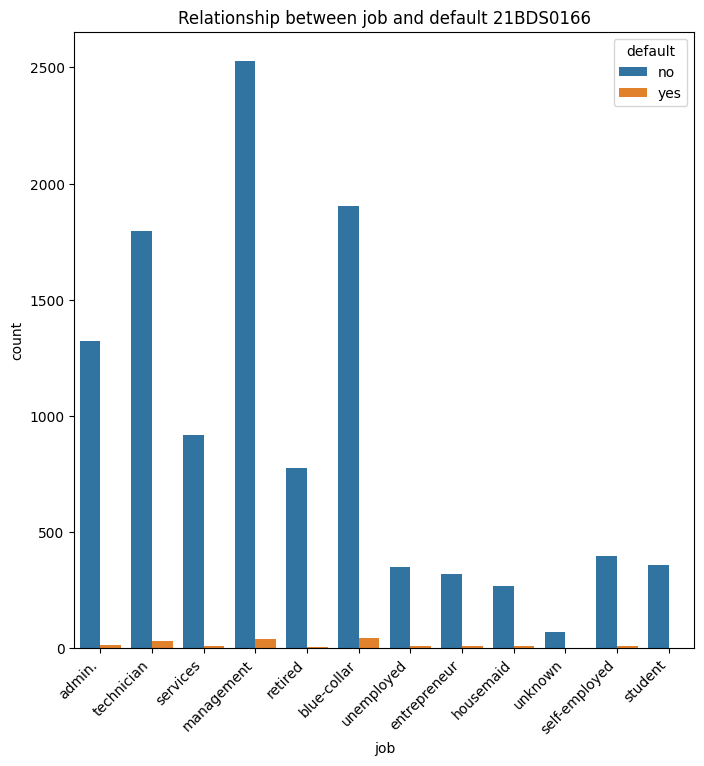

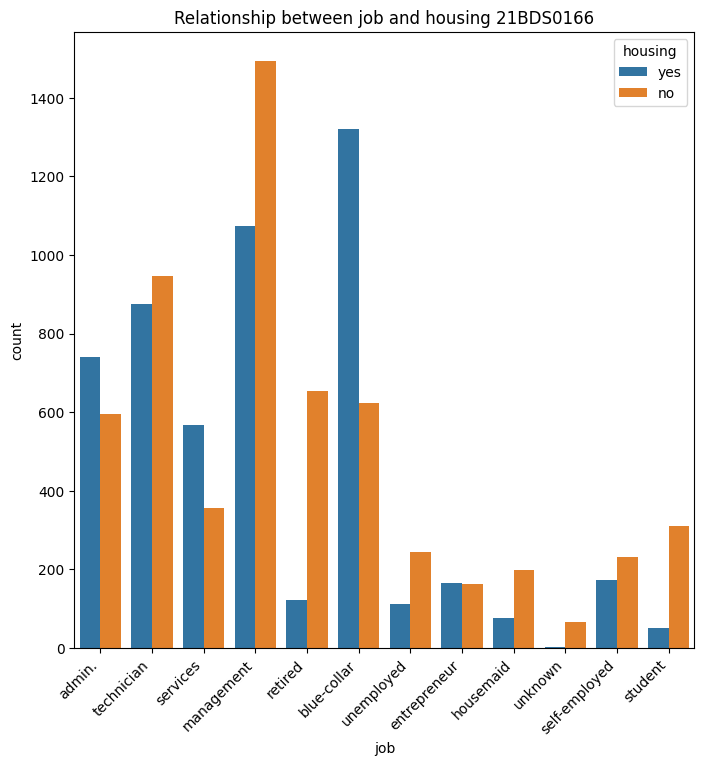

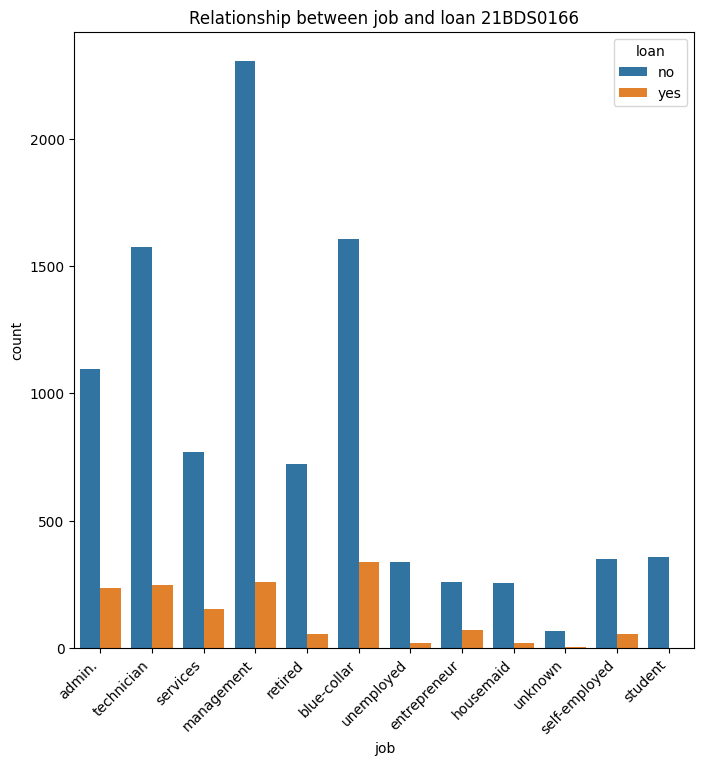

...

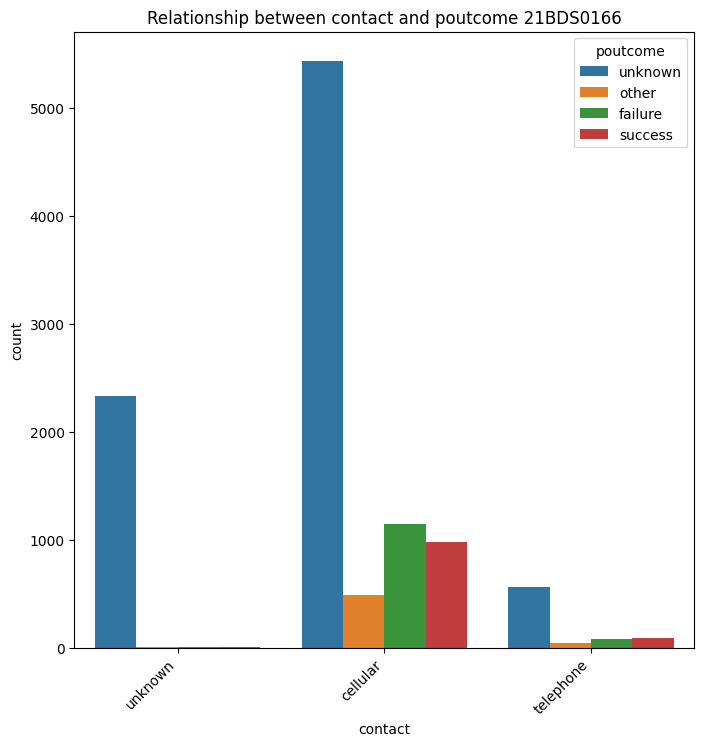

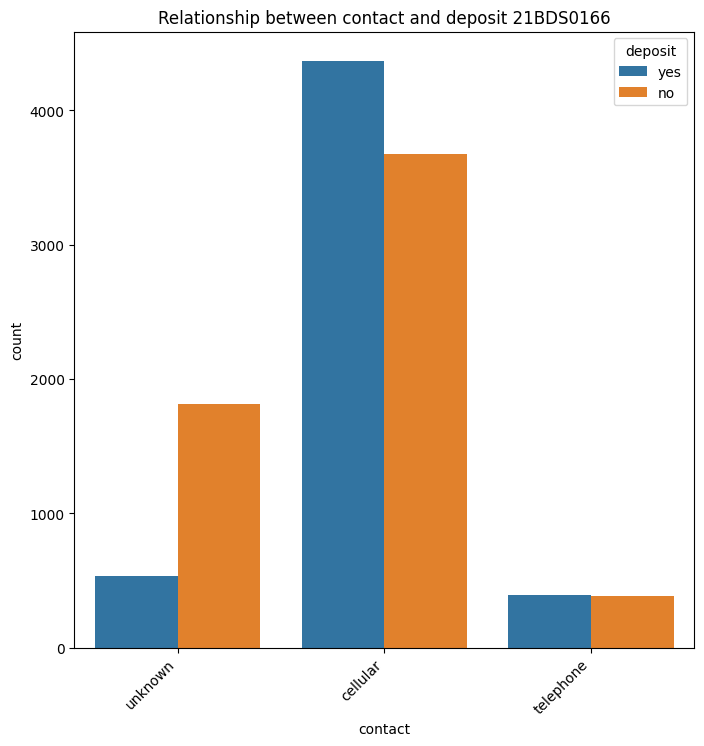

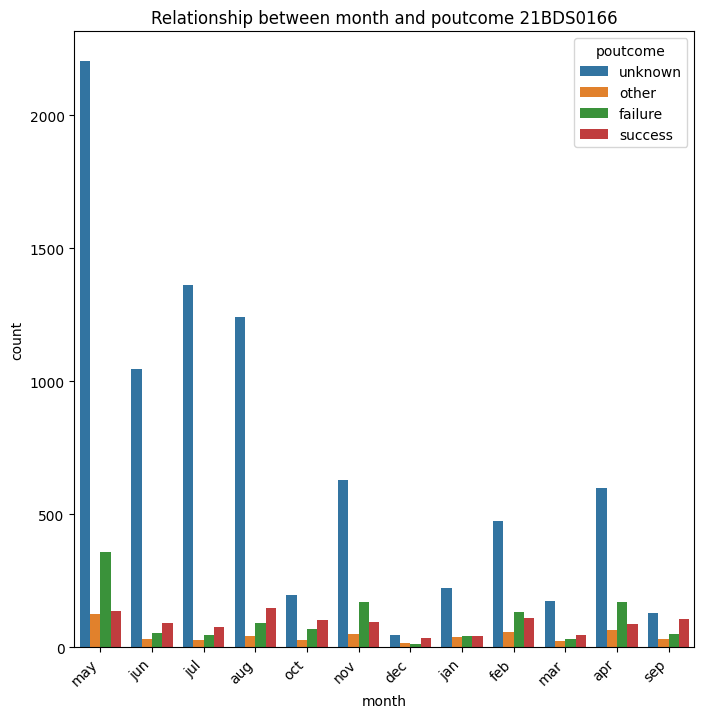

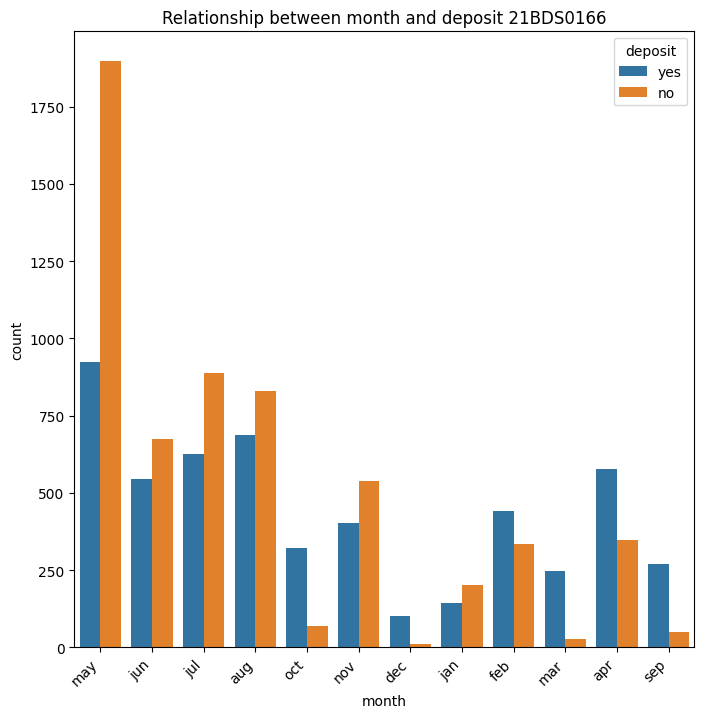

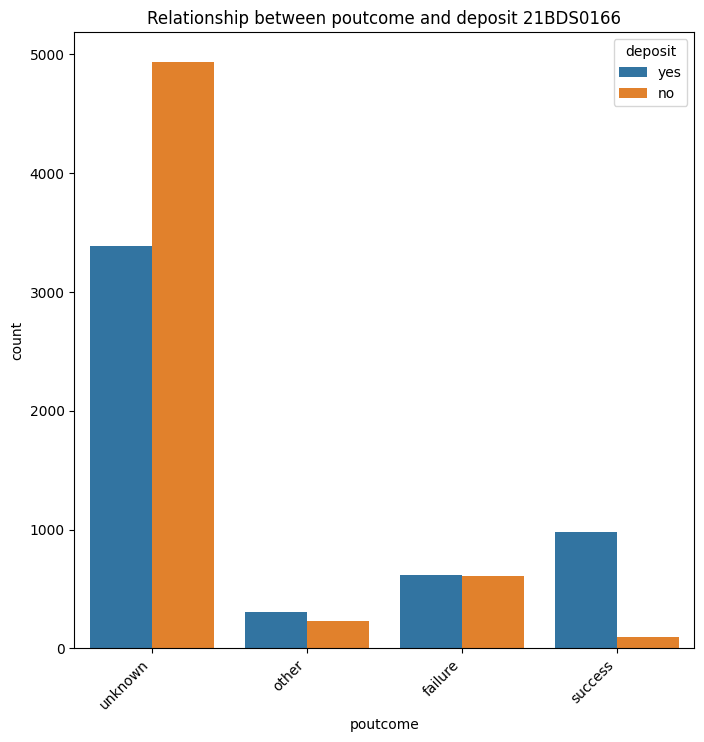

In [70]:
# Bivariate Analysis
# Categorical vs. Categorical
for i in range(0, len(cat_cols)):
    for j in range(i+1, len(cat_cols)):
      plt.figure(figsize=(8,8))
      sns.countplot(x=cat_cols[i], hue=cat_cols[j], data=df)
      plt.title(f"Relationship between {cat_cols[i]} and {cat_cols[j]} 21BDS0166")
      plt.xticks(rotation=45, ha="right")
      plt.show()

In [71]:
# Check for the target class values present
print(df['deposit'].unique())

['yes' 'no']


In [72]:
# Remove leading/trailing spaces in deposit column
df['deposit'] = df['deposit'].str.strip()

# Map 'yes'/'no' to 1/0 for Multivariate Analysis
df['deposit'] = df['deposit'].map({'yes': 1, 'no': 0})

In [73]:
from sklearn.preprocessing import LabelEncoder

cat_cols = df.select_dtypes(include=['object']).columns.tolist()

label_encoders = {}
for col in cat_cols:
    # Adding If condition for the 'deposit' column since it is already mapped
    if col == 'deposit':
        continue
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

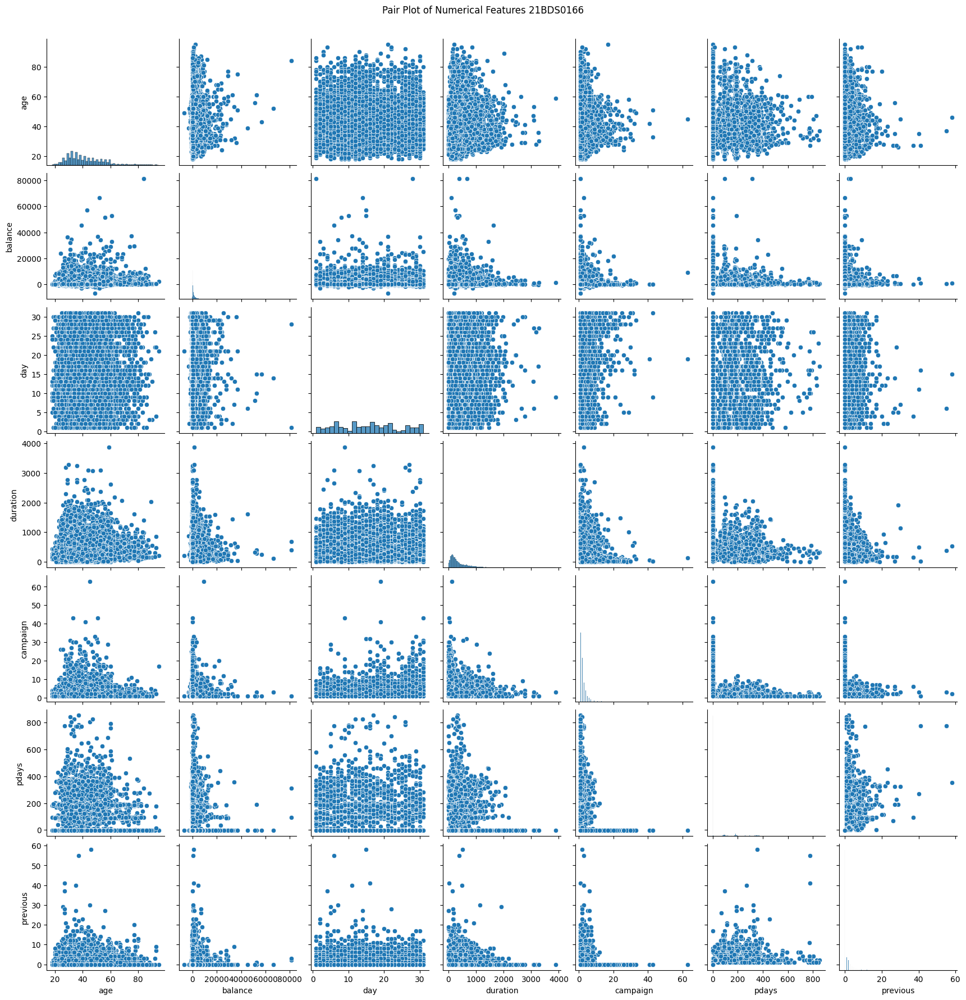

In [74]:
# Multivariate Analysis

# Pair Plot (Numerical Features)
sns.pairplot(df[num_cols])
plt.suptitle('Pair Plot of Numerical Features 21BDS0166', y=1.02)
plt.show()


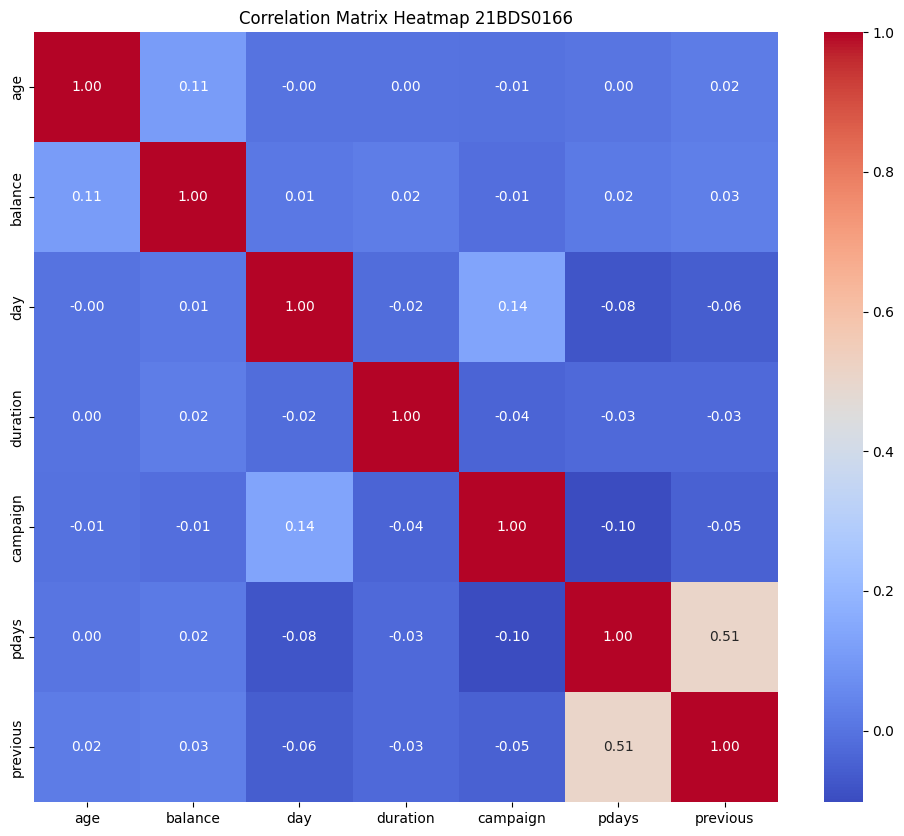

In [75]:
# Multivariate Analysis
# Heatmap (Correlation Matrix)
plt.figure(figsize=(12, 10))
# Calculate correlation only for numerical columns
correlation_matrix = df[num_cols].corr()  # Select only numerical columns for correlation
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap 21BDS0166')
plt.show()

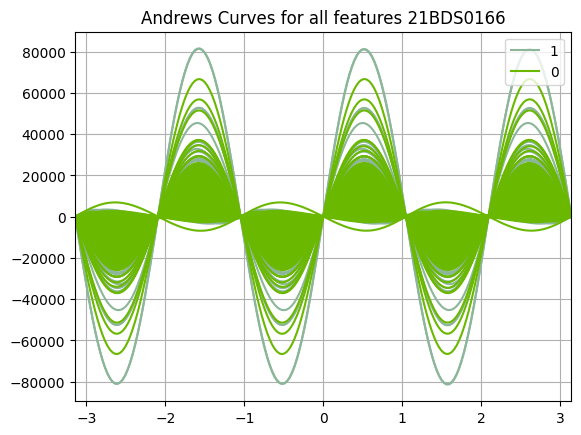

In [76]:
# Multivariate Analysis
# Andrews Curves
from pandas.plotting import andrews_curves
andrews_curves(df, 'deposit')
plt.title('Andrews Curves for all features 21BDS0166')
plt.show()

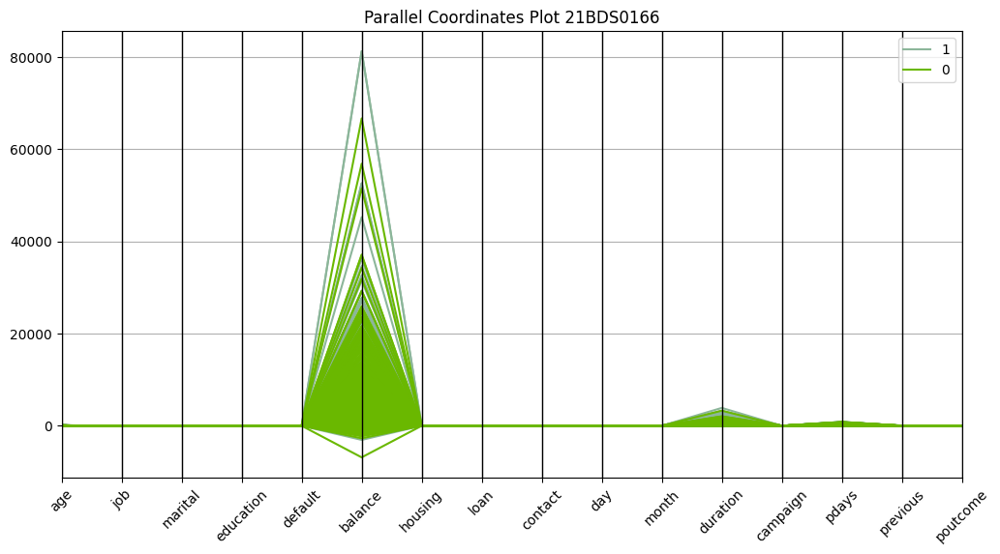

In [86]:
# Multivariate Analysis
# Parallel Coordinates
from pandas.plotting import parallel_coordinates
plt.figure(figsize=(12, 6))
parallel_coordinates(df, 'deposit')
plt.title('Parallel Coordinates Plot 21BDS0166')
plt.xticks(rotation=45)
plt.show()

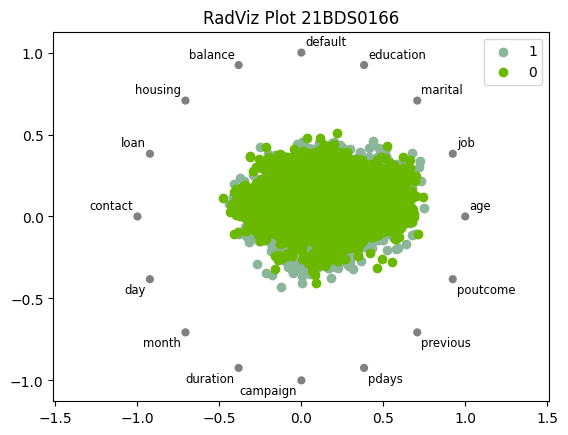

In [78]:
# Multivariate Analysis
# RadViz
from pandas.plotting import radviz
radviz(df, 'deposit')
plt.title('RadViz Plot 21BDS0166')
plt.show()

Yes Deposits by Month:
     month  deposit  month_num
0       0      577        NaN
1       1      688        NaN
2       2      100        NaN
3       3      441        NaN
4       4      142        NaN
5       5      627        NaN
6       6      546        NaN
7       7      248        NaN
8       8      925        NaN
9       9      403        NaN
10     10      323        NaN
11     11      269        NaN


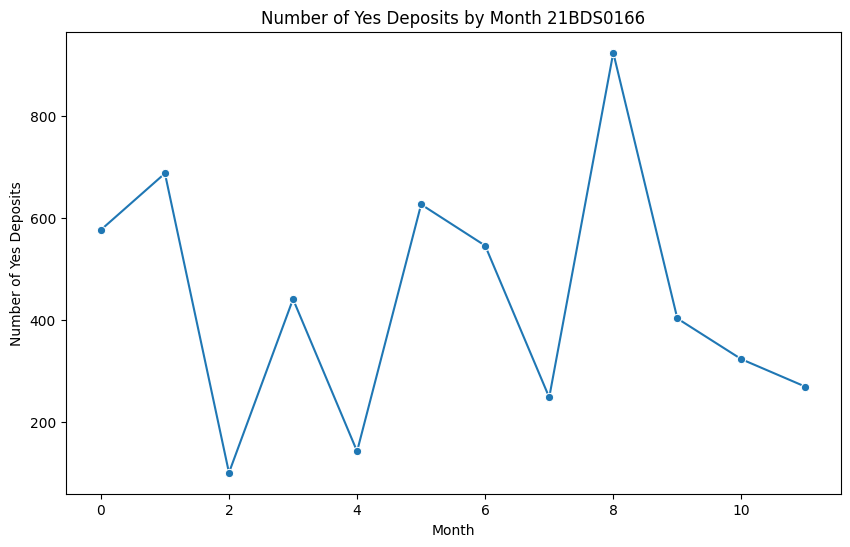

In [87]:
# TIME SERIES ANALYSIS

# --- Trend Analysis by Month ---
# Group by month and count the number of 'yes' deposits where yes = 1
yes_deposits_by_month = df.groupby('month')['deposit'].apply(lambda x: (x == 1).sum()).reset_index()

# To sort the months in calendar order, map month abbreviations to their numerical order.
month_order = {'jan':1, 'feb':2, 'mar':3, 'apr':4, 'may':5, 'jun':6,
               'jul':7, 'aug':8, 'sep':9, 'oct':10, 'nov':11, 'dec':12}
yes_deposits_by_month['month_num'] = yes_deposits_by_month['month'].map(month_order)
yes_deposits_by_month = yes_deposits_by_month.sort_values('month_num')

print("Yes Deposits by Month:\n", yes_deposits_by_month)

# Plot the monthly trend as a line plot
plt.figure(figsize=(10,6))
sns.lineplot(data=yes_deposits_by_month, x='month', y='deposit', marker='o')
plt.title('Number of Yes Deposits by Month 21BDS0166')
plt.xlabel('Month')
plt.ylabel('Number of Yes Deposits')
plt.show()

Yes Deposits by Day:
      day  deposit
0    1.0       90
1    2.0      182
2    3.0      178
3    4.0      230
4    5.0      215
5    6.0      181
6    7.0      157
7    8.0      201
8    9.0      179
9   10.0      121
10  11.0      181
11  12.0      244
12  13.0      241
13  14.0      210
14  15.0      238
15  16.0      192
16  17.0      176
17  18.0      228
18  19.0      122
19  20.0      192
20  21.0      201
21  22.0      154
22  23.0      126
23  24.0       62
24  25.0      133
25  26.0      116
26  27.0      150
27  28.0      143
28  29.0      129
29  30.0      271
30  31.0       46


<ipython-input-89-9fd2ffc45605>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=yes_deposits_by_day, x='day', y='deposit', palette='viridis')


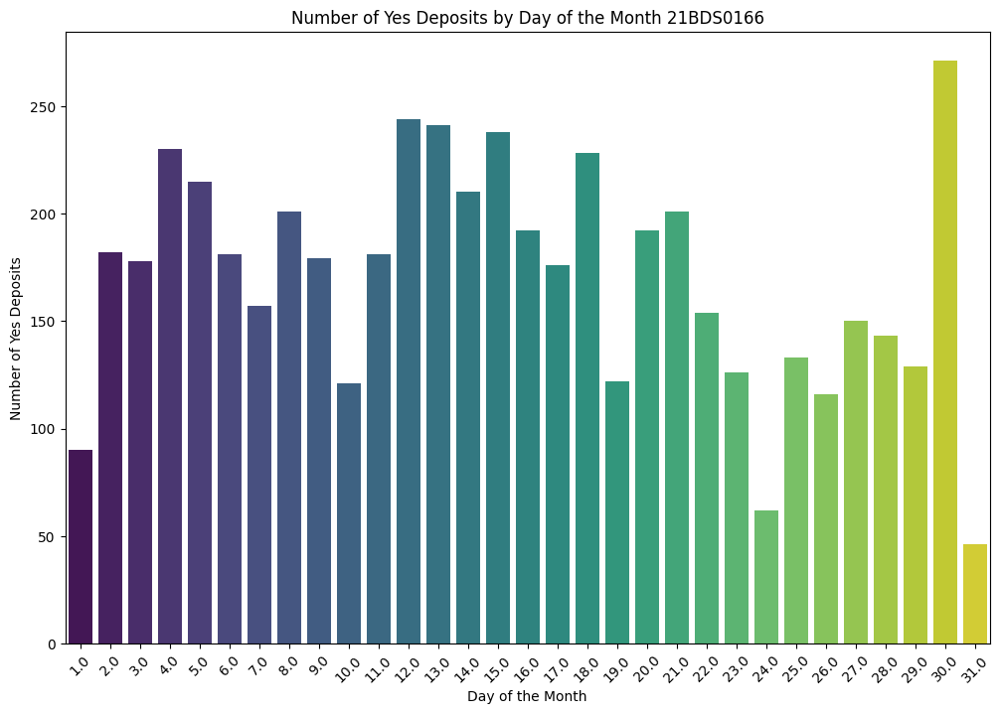

In [89]:
# TIME SERIES ANALYSIS
# --- Trend Analysis by Day ---
# Group by day and count the number of 'yes' deposits
yes_deposits_by_day = df.groupby('day')['deposit'].apply(lambda x: (x == 1 ).sum()).reset_index()
yes_deposits_by_day = yes_deposits_by_day.sort_values('day')

print("Yes Deposits by Day:\n", yes_deposits_by_day)

# Plot the day trend as a bar plot
plt.figure(figsize=(12,8))
sns.barplot(data=yes_deposits_by_day, x='day', y='deposit', palette='viridis')
plt.title('Number of Yes Deposits by Day of the Month 21BDS0166')
plt.xlabel('Day of the Month')
plt.ylabel('Number of Yes Deposits')
plt.xticks(rotation=45)
plt.show()